In [11]:
import mne
from mne.io import concatenate_raws, read_raw_edf
import matplotlib.pyplot as plt
import mne.viz
import os
import os.path as op
from mne.preprocessing import (ICA, create_eog_epochs, create_ecg_epochs,
                               corrmap)
import numpy as np
from mne.time_frequency import tfr_multitaper
from mne.stats import permutation_cluster_1samp_test as pcluster_test
from mne.datasets import fetch_fsaverage

import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as signal
import scipy as sc
from matplotlib import cm
import matplotlib.colors as colors

from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.arima.model import ARIMA

# Load dataset & plot raw data 

In [12]:
def dataset_creator(files, event, tmin=0, tmax=4, freq=500):

    """
    Take the data from every file and collect only those corresponding to GDF-left or GDF-right in the interest_data list
    Those events last for a number of data corresponding to segment_length

    parameters: files: string list corresponding to the data folders paths
                events: int list corresponding to the numbers representatives of the events of interest
                segment_length: int corresponding to the length of the data segment we will keep
    """
    MI = []
    rest = []
    tmin, tmax = tmin * freq, tmax * freq

    for file in files:
        data = mne.io.read_raw_edf(file, preload=True)
        raw_data = data.get_data()
        total_events, dict = mne.events_from_annotations(data)
        index_events = [dict[event[i]] for i in range(len(event))]  
        index = [i for i in range(total_events.shape[0]) if total_events[i, 2] in index_events]
        interest_events = total_events[index, 0]
        interest_events_label = total_events[index, 2]
        for i in range(interest_events.shape[0]):
            if interest_events_label[i] == index_events[0]:
                MI.append(raw_data[:, interest_events[i] + tmin:interest_events[i] + tmax])
            elif interest_events_label[i] == index_events[1]:
                rest.append(raw_data[:, interest_events[i] + tmin:interest_events[i] + tmax])

    return np.array(MI), np.array(rest)

Extracting EDF parameters from /network/lustre/iss02/aramis/projects/cracknetworks/sub-14/ses-03/EEG/Train-[2022.05.05-15.00.03].edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 237999  =      0.000 ...   475.998 secs...


/tmp/ipykernel_346756/662467125.py:10: RuntimeWarning: Invalid patient information 
  raws = read_raw_edf(input_fname1, preload=True)


Number of channels:  64
Number of samples:  64


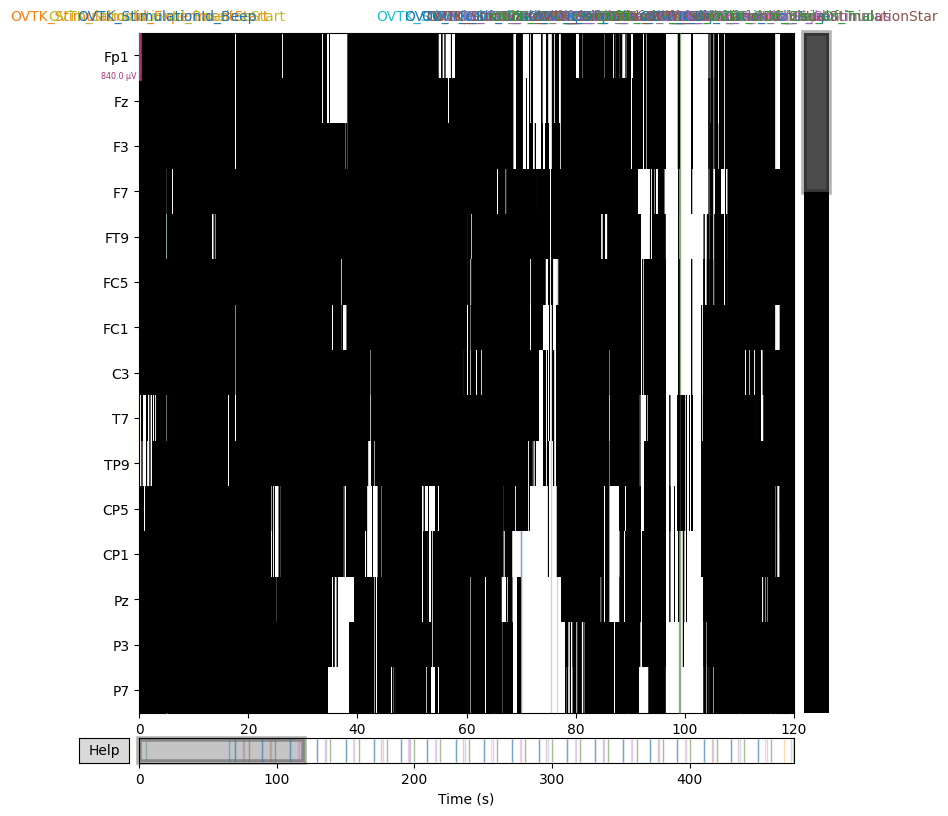

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)


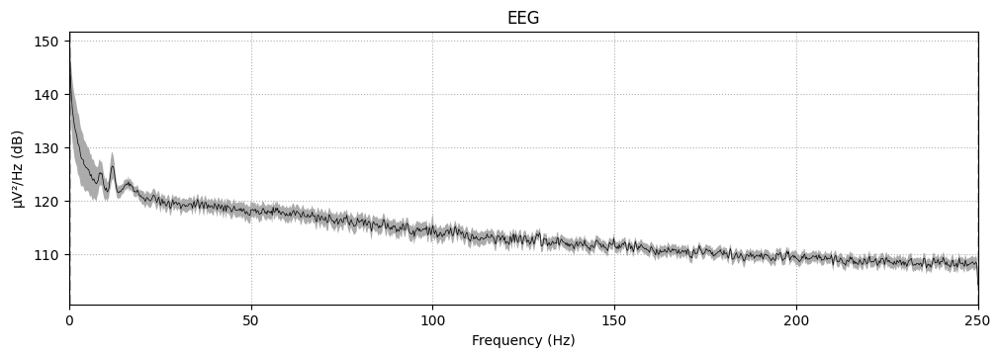

In [13]:
#Define the parameters
subject = 1  # use data from subject 1
runs = [6, 10, 14]  # use only hand and feet motor imagery runs

#Get data and locate in to given path
input_fname1 =  "/network/lustre/iss02/aramis/projects/cracknetworks/sub-14/ses-03/EEG/Train-[2022.05.05-15.00.03].edf"
input_fname2 =  "/network/lustre/iss02/aramis/projects/cracknetworks/sub-14/ses-03/EEG/Train-[2022.05.05-15.09.24].edf"
input_fname3 =  "/network/lustre/iss02/aramis/projects/cracknetworks/sub-14/ses-03/EEG/Train-[2022.05.05-15.18.26].edf"
#Read raw data files where each file contains a run
raws = read_raw_edf(input_fname1, preload=True)
#Combine all loaded runs
#raw_obj = concatenate_raws(raws)
raw_obj = raws

raw_data = raw_obj.get_data()
print("Number of channels: ", str(len(raw_data)))
print("Number of samples: ", str(len(raw_data)))

#Plot epochs & PSD
raw_obj.plot(duration=120, n_channels=15, scalings=dict(eeg=420e-6))
raw_obj.plot_psd(average=True)

In [14]:
list_channels = raw_obj.ch_names

In [15]:
event = ['OVTK_GDF_Left', 'OVTK_GDF_Right']
input_fname_list = [input_fname1, input_fname2, input_fname3]
MI, rest = dataset_creator(input_fname_list, event, tmin=0, tmax=4, freq=500)

Extracting EDF parameters from /network/lustre/iss02/aramis/projects/cracknetworks/sub-14/ses-03/EEG/Train-[2022.05.05-15.00.03].edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 237999  =      0.000 ...   475.998 secs...


/tmp/ipykernel_346756/3954399824.py:16: RuntimeWarning: Invalid patient information 
  data = mne.io.read_raw_edf(file, preload=True)


Used Annotations descriptions: ['OVTK_GDF_Cross_On_Screen', 'OVTK_GDF_End_Of_Session', 'OVTK_GDF_End_Of_Trial', 'OVTK_GDF_Feedback_Continuous', 'OVTK_GDF_Left', 'OVTK_GDF_Right', 'OVTK_GDF_Start_Of_Trial', 'OVTK_StimulationId_BaselineStart', 'OVTK_StimulationId_BaselineStop', 'OVTK_StimulationId_Beep', 'OVTK_StimulationId_ExperimentStart', 'OVTK_StimulationId_ExperimentStop', 'OVTK_StimulationId_Train', 'OVTK_StimulationId_VisualStimulationStar']
Extracting EDF parameters from /network/lustre/iss02/aramis/projects/cracknetworks/sub-14/ses-03/EEG/Train-[2022.05.05-15.09.24].edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 237999  =      0.000 ...   475.998 secs...


/tmp/ipykernel_346756/3954399824.py:16: RuntimeWarning: Invalid patient information 
  data = mne.io.read_raw_edf(file, preload=True)


Used Annotations descriptions: ['OVTK_GDF_Cross_On_Screen', 'OVTK_GDF_End_Of_Session', 'OVTK_GDF_End_Of_Trial', 'OVTK_GDF_Feedback_Continuous', 'OVTK_GDF_Left', 'OVTK_GDF_Right', 'OVTK_GDF_Start_Of_Trial', 'OVTK_StimulationId_BaselineStart', 'OVTK_StimulationId_BaselineStop', 'OVTK_StimulationId_Beep', 'OVTK_StimulationId_ExperimentStart', 'OVTK_StimulationId_ExperimentStop', 'OVTK_StimulationId_Train', 'OVTK_StimulationId_VisualStimulationStar']
Extracting EDF parameters from /network/lustre/iss02/aramis/projects/cracknetworks/sub-14/ses-03/EEG/Train-[2022.05.05-15.18.26].edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 237999  =      0.000 ...   475.998 secs...


/tmp/ipykernel_346756/3954399824.py:16: RuntimeWarning: Invalid patient information 
  data = mne.io.read_raw_edf(file, preload=True)


Used Annotations descriptions: ['OVTK_GDF_Cross_On_Screen', 'OVTK_GDF_End_Of_Session', 'OVTK_GDF_End_Of_Trial', 'OVTK_GDF_Feedback_Continuous', 'OVTK_GDF_Left', 'OVTK_GDF_Right', 'OVTK_GDF_Start_Of_Trial', 'OVTK_StimulationId_BaselineStart', 'OVTK_StimulationId_BaselineStop', 'OVTK_StimulationId_Beep', 'OVTK_StimulationId_ExperimentStart', 'OVTK_StimulationId_ExperimentStop', 'OVTK_StimulationId_Train', 'OVTK_StimulationId_VisualStimulationStar']


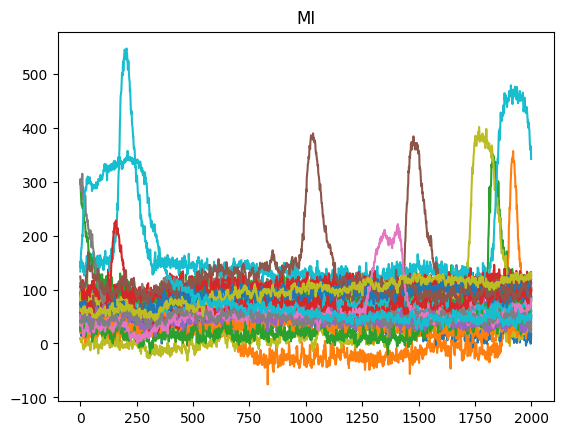

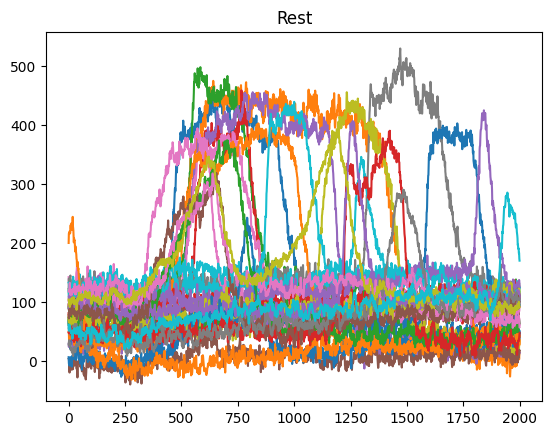

In [17]:
for i in range(0, len(MI)):
    plt.plot(MI[i][0, :])
plt.title('MI')
plt.show()

for i in range(0, len(rest)):
    plt.plot(rest[i][0, :])
plt.title('Rest')
plt.show()


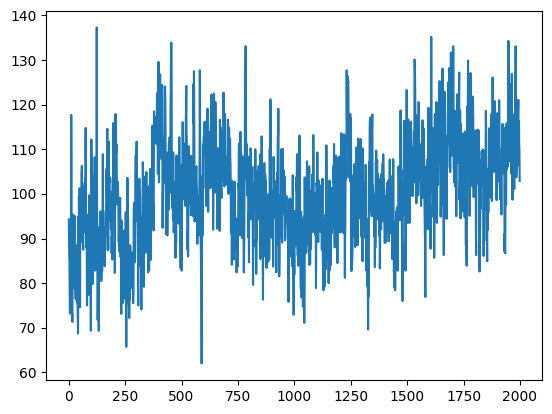

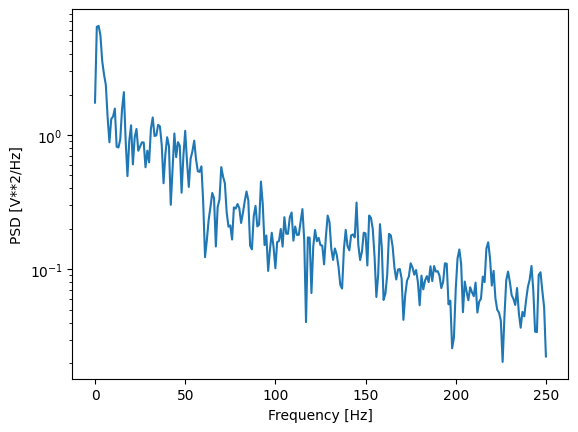

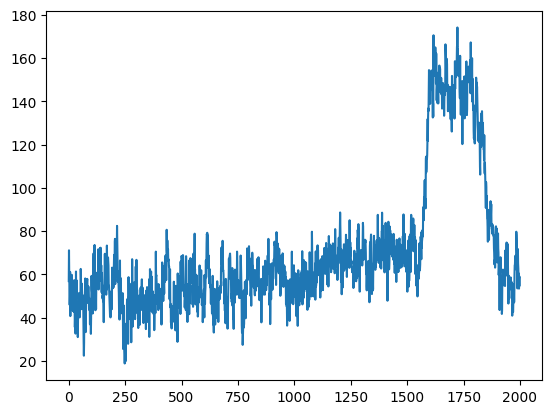

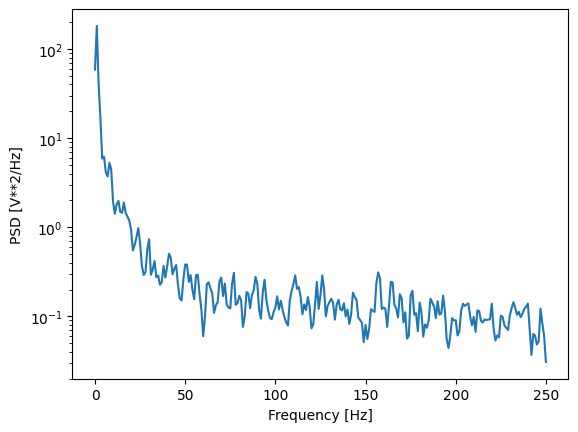

In [18]:
x = MI[3,0,:]
plt.plot(x)
plt.show()
Pxx = signal.welch(x, fs=500, nperseg=500, noverlap=250, nfft=500)
f, ax = plt.subplots()
ax.plot(Pxx[0], Pxx[1])
ax.set_yscale('log')
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel('PSD [V**2/Hz]') 
plt.show()

y = rest[10,1,:]
plt.plot(y)
plt.show()
Pyy = signal.welch(y, fs=500, nperseg=500, noverlap=250, nfft=500)
f, ax = plt.subplots()
ax.plot(Pyy[0], Pyy[1])
ax.set_yscale('log')
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel('PSD [V**2/Hz]') 
plt.show()

# Investigate Coherence

In [8]:
def crossSpectrum_Welsh(x, y, nperseg=500, overlap=250, window='hann', padding = False, aggregate='mean', mode = "scipy", f_sample = None, f=None):

    if f_sample is not None and f is not None:
        l = f * nperseg / f_sample
    D = nperseg - overlap
    L = nperseg
    N = len(x)
    if padding and (N - L) % D != 0:
        # Zero padding
        overflow = ((N-L)//D+1)*D + L - N
        x = np.append(x, np.zeros(overflow))
        y = np.append(y, np.zeros(overflow))

    cross = []
    ind = 0
    K = 0

    if window == 'hann':
        window = signal.windows.hann(L)
    elif window == 'hamming':
        window = signal.windows.hamming(L)
    elif window == 'blackman':
        window = signal.windows.blackman(L)
    else:
        window = signal.windows.boxcar(L)

    U = np.sum(window**2) / L
    
    while ind + L <= len(x):

        xp = x[ind : ind + L] 
        yp = y[ind : ind + L] 
        xp = sc.signal.detrend(xp, type='constant')
        yp = sc.signal.detrend(yp, type='constant')

        # Do FFT
        if mode == "scipy":
            cfx = sc.fft.fft(xp * window / L)
            cfy = sc.fft.fft(yp * window / L)
        if mode == "manual":
            exp_vector = np.exp(-2j * np.pi * np.arange(L) * l / L)
            cfx = np.dot(xp * window / L, exp_vector)
            cfy = np.dot(yp * window / L, exp_vector)

        # Get cross spectrum
        cross.append(cfx.conj()*cfy)

        ind += D
        K += 1
    
    cross = np.array(cross) 

    if aggregate == "mean":
        cross = np.mean(cross, axis=0)
    elif aggregate == "median":
        cross = np.median(cross, axis=0)
    elif aggregate == "max":
        cross = np.max(cross, axis=0)
    
    return cross

In [9]:
def coherence_Welsh(x, y, nperseg=500, overlap=250, window='hann', padding = False, aggregate='mean', mode = "scipy", f_sample = None, f=None):

    Pxy = crossSpectrum_Welsh(x, y, nperseg, overlap, window, padding, aggregate, mode, f_sample, f)
    Pxx = crossSpectrum_Welsh(x, x, nperseg, overlap, window, padding, aggregate, mode, f_sample, f)
    Pyy = crossSpectrum_Welsh(y, y, nperseg, overlap, window, padding, aggregate, mode, f_sample, f)
    coherence = np.abs(Pxy)**2 / (Pxx * Pyy + 1e-3)
    return np.real(coherence)

/home/aurelien.stumpf/Code/deep_env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


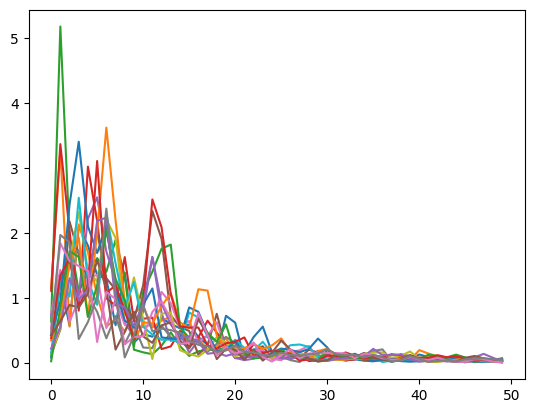

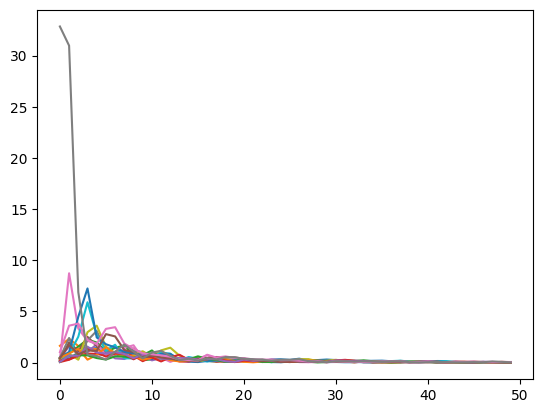

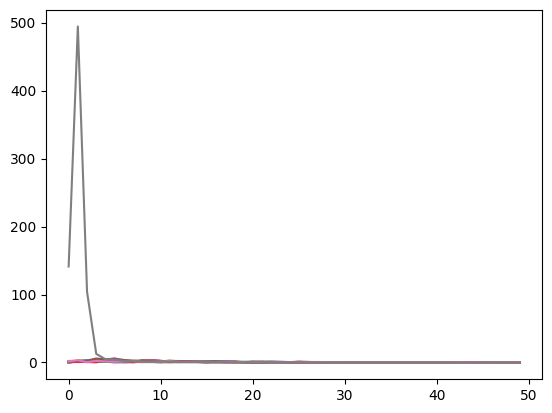

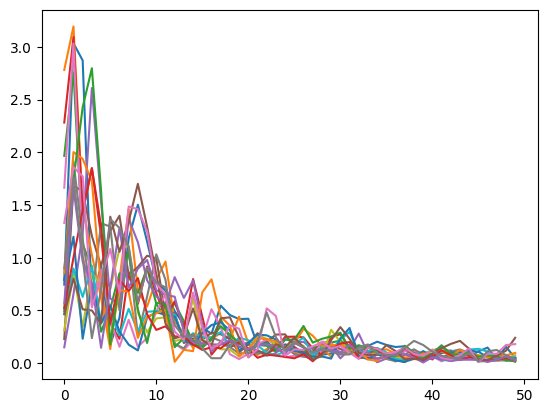

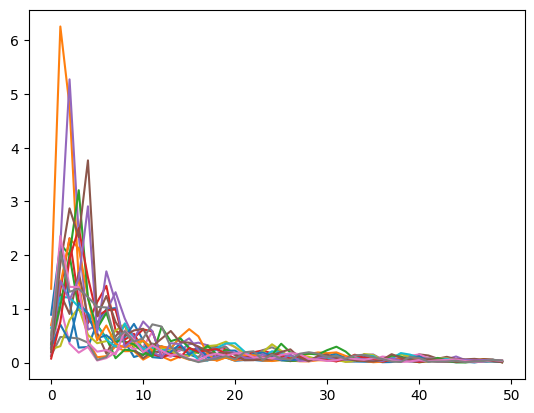

...

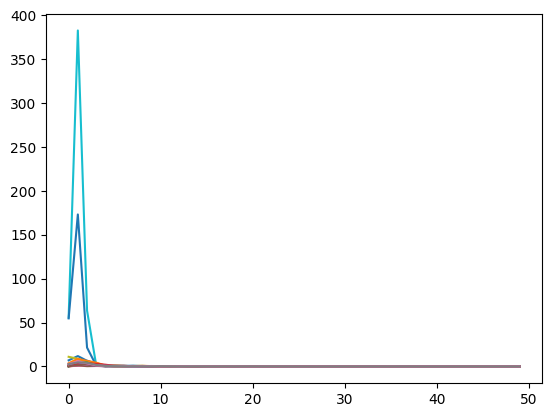

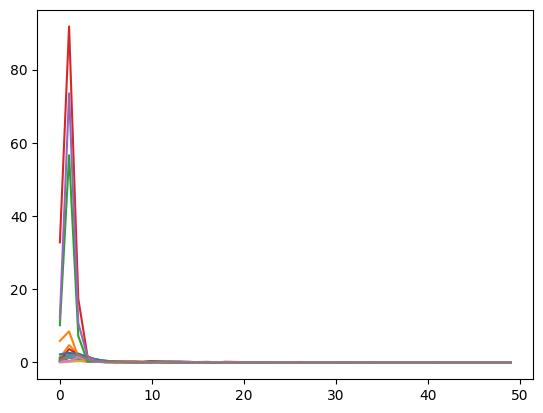

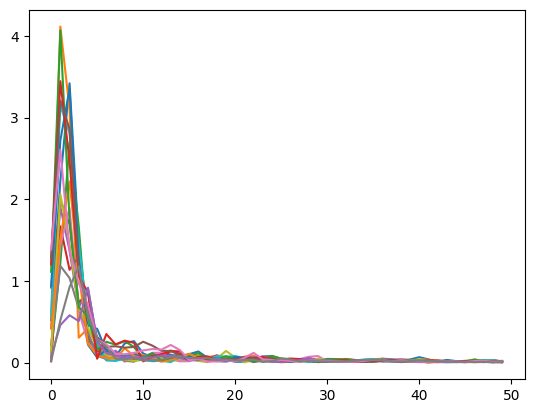

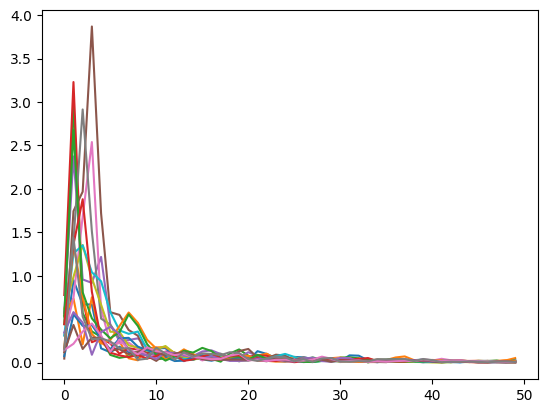

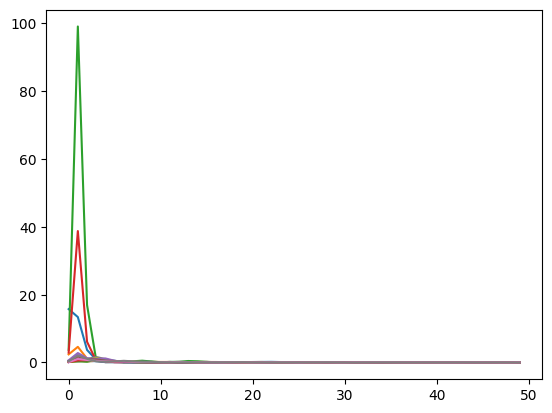

IndexError: index 30 is out of bounds for axis 0 with size 30

In [34]:
for i in range(0,64):
    t = 0
    while t < 2000-200:
        x = MI[i,0,t:t+200]
        Pxx = crossSpectrum_Welsh(x, x, nperseg=100, overlap=50, window='hann', padding = False, aggregate='mean', mode = "scipy", f_sample = 500, f=500)
        plt.plot(Pxx[:len(Pxx)//2])
        t += 100
    plt.show()

In [35]:
coh = np.zeros((64,64,500))
for i in range(64):
    for j in range(i,64):
        x = MI[0,i,:]
        y = MI[0,j,:]
        coh[i,j] = coherence_Welsh(x, y, nperseg=500, overlap=250, window='hann', padding = False, aggregate='mean', mode = "scipy")
        coh[j,i] = coh[i,j]

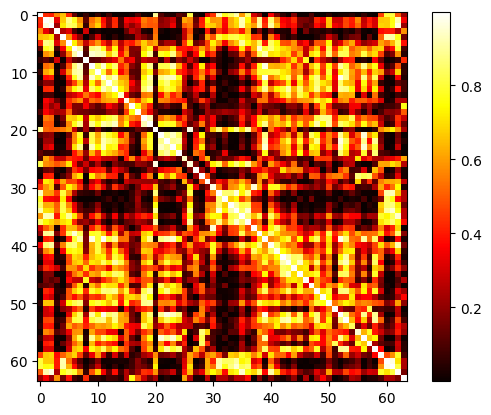

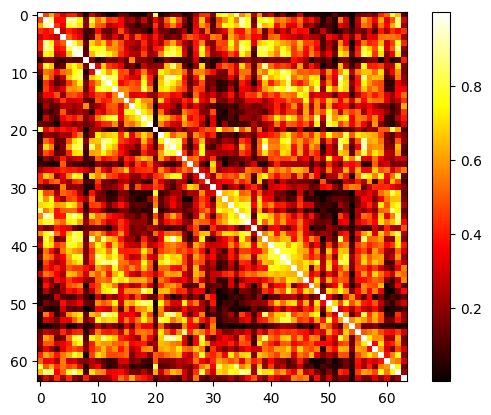

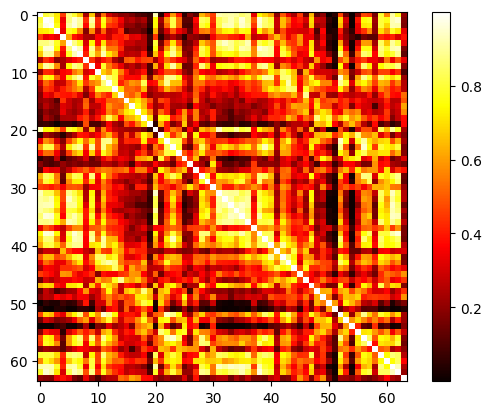

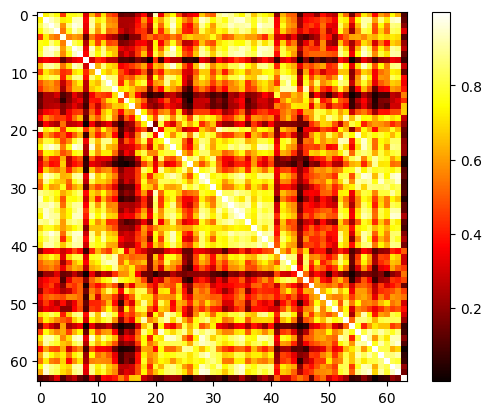

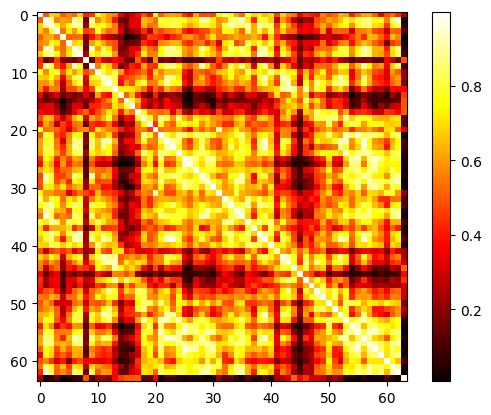

...

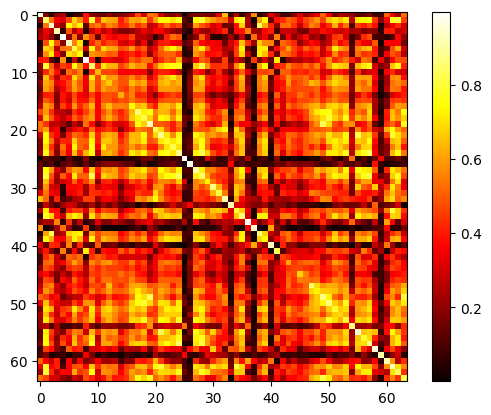

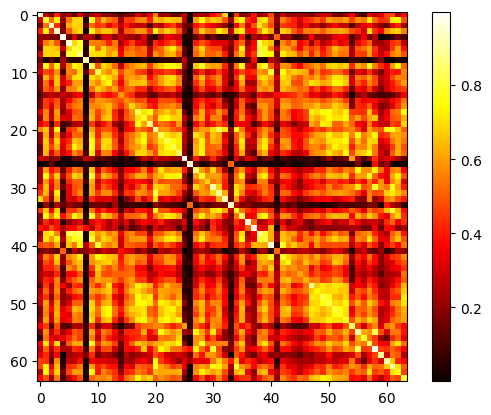

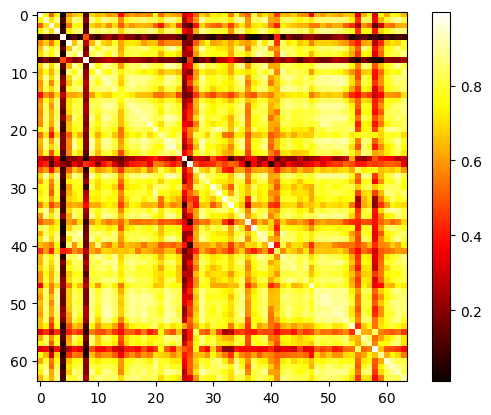

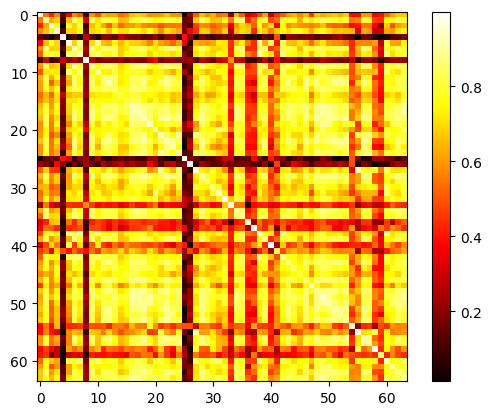

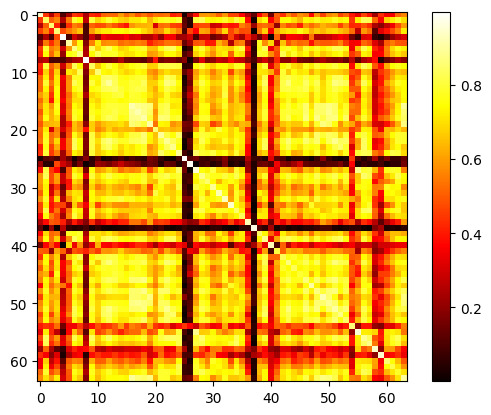

In [36]:
for i in range(40):
    plt.imshow(coh[:,:,i], cmap='hot', interpolation='nearest')
    plt.colorbar()
    plt.show()

In [19]:
#t-test on PSD for each channel
nperseg = 100
n_channels = 64
n_mi_trials = MI.shape[0]
n_res_trials = rest.shape[0]

t_stat_corr = np.zeros((n_channels,n_channels,nperseg//2+1))
p_values_corr = np.zeros((n_channels,n_channels,nperseg//2+1))
for channel_id in range(n_channels): #for each channel
    print("Channel: ", channel_id)
    for channel_id2 in range(channel_id,n_channels):
        MI_set = np.zeros((nperseg//2+1, n_mi_trials))
        rest_set = np.zeros((nperseg//2+1, n_res_trials))

        for trial_id in range(MI.shape[0]): #for each trial
            signal_mi_1 = MI[trial_id, channel_id, 500:1000]
            signal_mi_2 = MI[trial_id, channel_id2, 500:1000]
            
            Cxy = coherence_Welsh(signal_mi_1, signal_mi_2, nperseg=100, overlap=50, window='hann', padding = False, aggregate='mean', mode = "scipy")
            MI_set[:,trial_id] = np.abs(Cxy)[:nperseg//2+1]

        for trial_id in range(rest.shape[0]):
            signal_rest_1 = rest[trial_id, channel_id, 500:1000]
            signal_rest_2 = rest[trial_id, channel_id2, 500:1000]
            Cxy = coherence_Welsh(signal_rest_1, signal_rest_2, nperseg=100, overlap=50, window='hann', padding = False, aggregate='mean', mode = "scipy")
            rest_set[:,trial_id] = np.abs(Cxy)[:nperseg//2+1]

        t_stat_corr[channel_id,channel_id2,:], p_values_corr[channel_id,channel_id2,:] = sc.stats.ttest_ind(MI_set, rest_set, axis=1)
        t_stat_corr[channel_id2,channel_id,:] = t_stat_corr[channel_id,channel_id2,:]
        p_values_corr[channel_id2,channel_id,:] = p_values_corr[channel_id,channel_id2,:]

print("t-statistics: ", t_stat_corr)
print("p-values: ", p_values_corr)

Channel:  0
Channel:  1
Channel:  2
Channel:  3
Channel:  4
Channel:  5
Channel:  6
Channel:  7
Channel:  8
Channel:  9
Channel:  10
Channel:  11
Channel:  12
Channel:  13
Channel:  14
Channel:  15
Channel:  16
Channel:  17
Channel:  18
Channel:  19
Channel:  20
Channel:  21
Channel:  22
Channel:  23
Channel:  24
Channel:  25
Channel:  26
Channel:  27
Channel:  28
Channel:  29
Channel:  30
Channel:  31
Channel:  32
Channel:  33
Channel:  34
Channel:  35
Channel:  36
Channel:  37
Channel:  38
Channel:  39
Channel:  40
Channel:  41
Channel:  42
Channel:  43
Channel:  44
Channel:  45
Channel:  46
Channel:  47
Channel:  48
Channel:  49
Channel:  50
Channel:  51
Channel:  52
Channel:  53
Channel:  54
Channel:  55
Channel:  56
Channel:  57
Channel:  58
Channel:  59
Channel:  60
Channel:  61
Channel:  62
Channel:  63
t-statistics:  [[[-3.19148192e+00 -1.96244276e+00 -2.73816652e+00 ... -3.76727494e-01
   -8.94771571e-01 -1.23866909e+00]
  [ 4.10809312e-01 -6.29466950e-01  2.18683841e+00 ... -

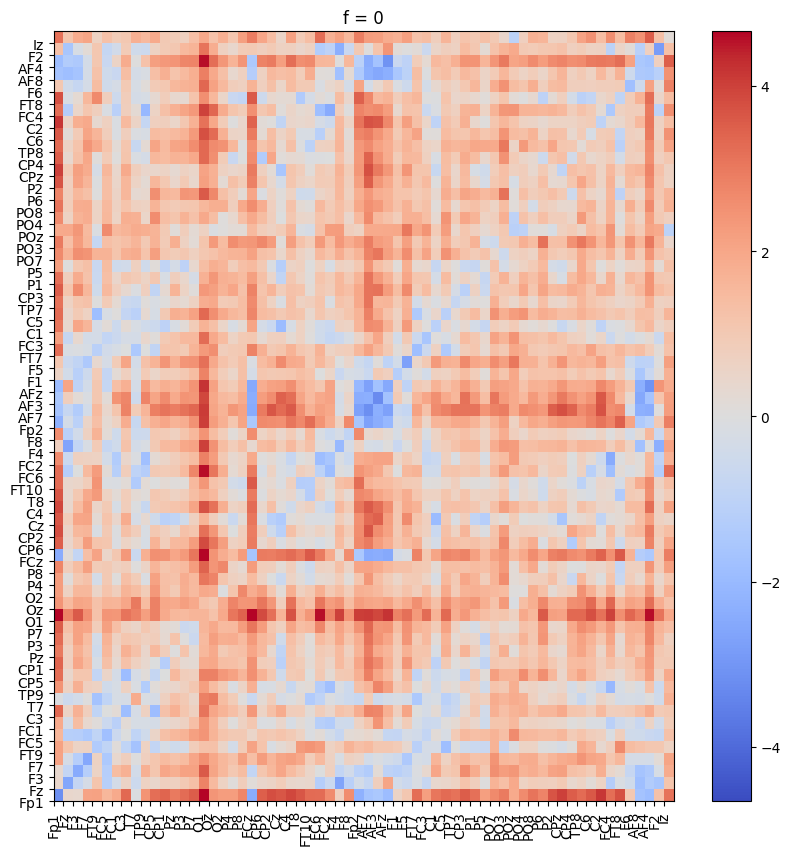

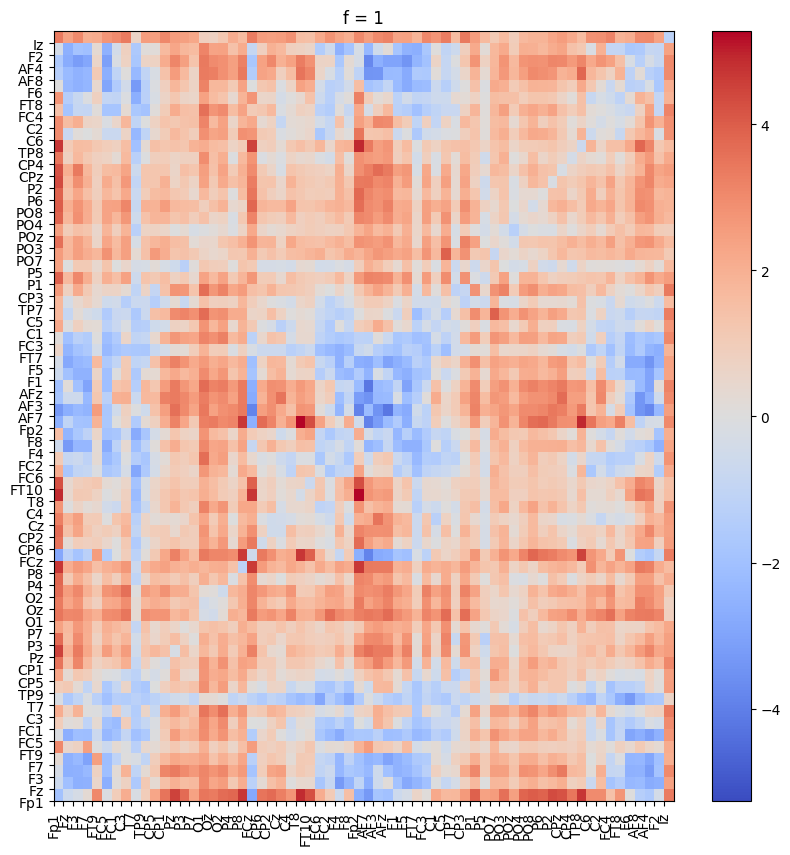

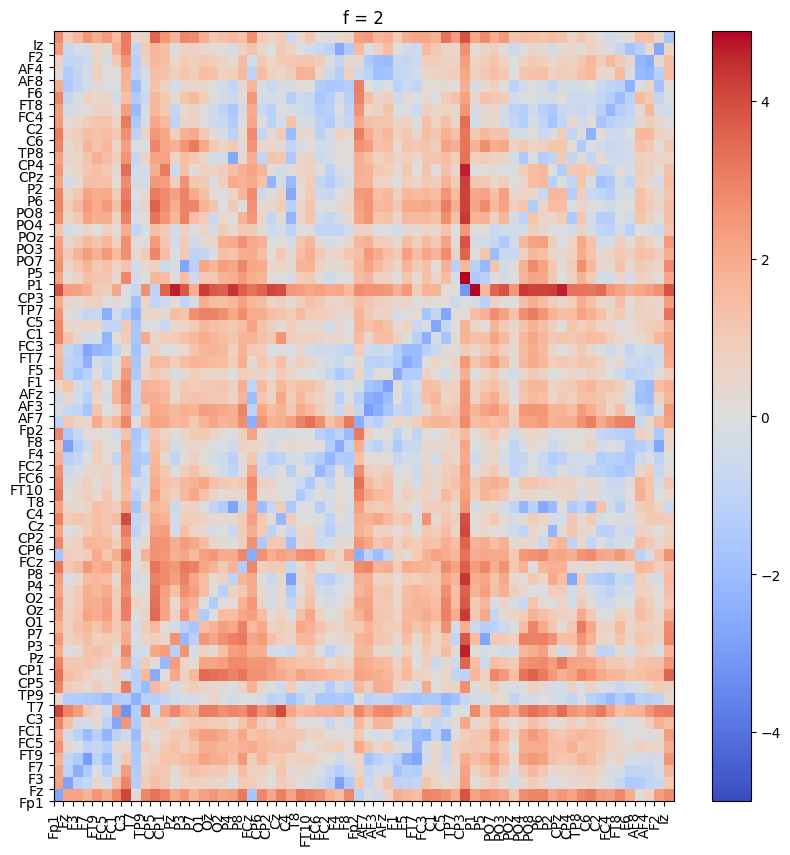

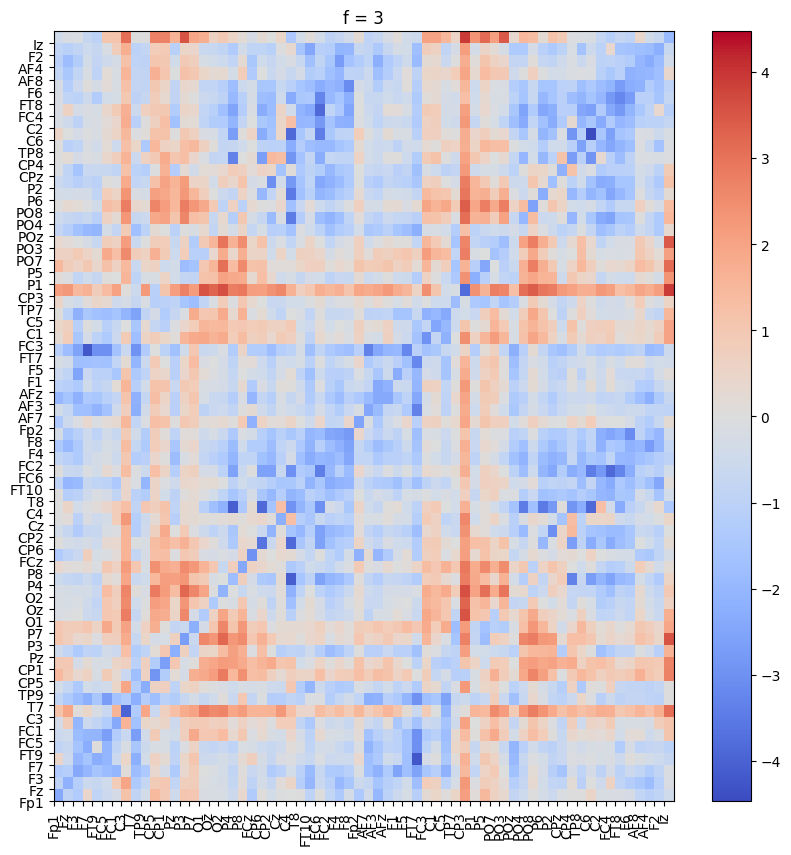

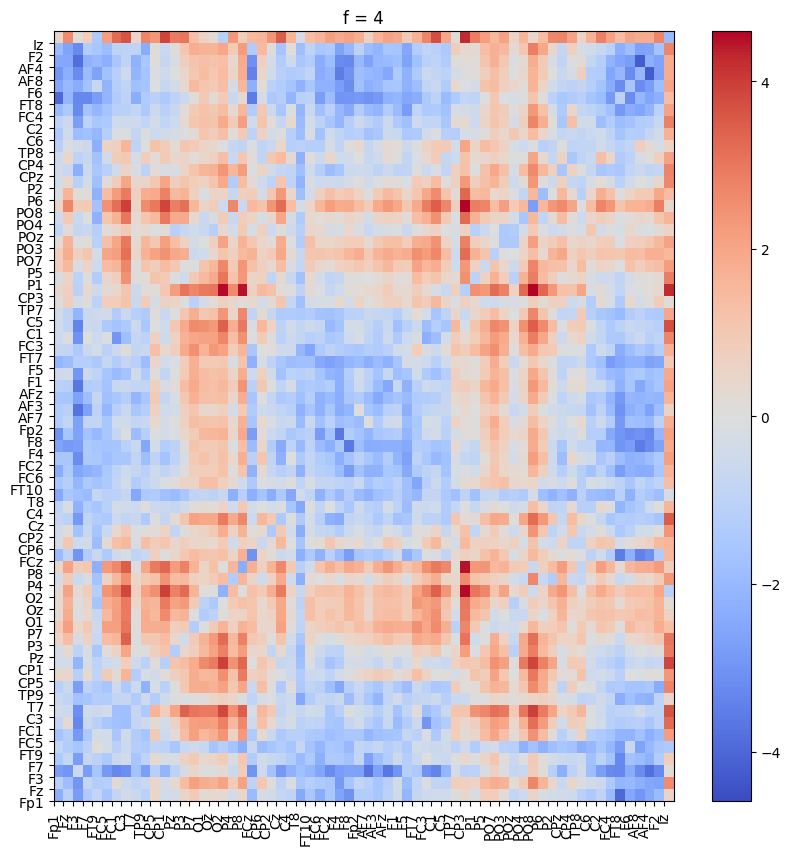

...

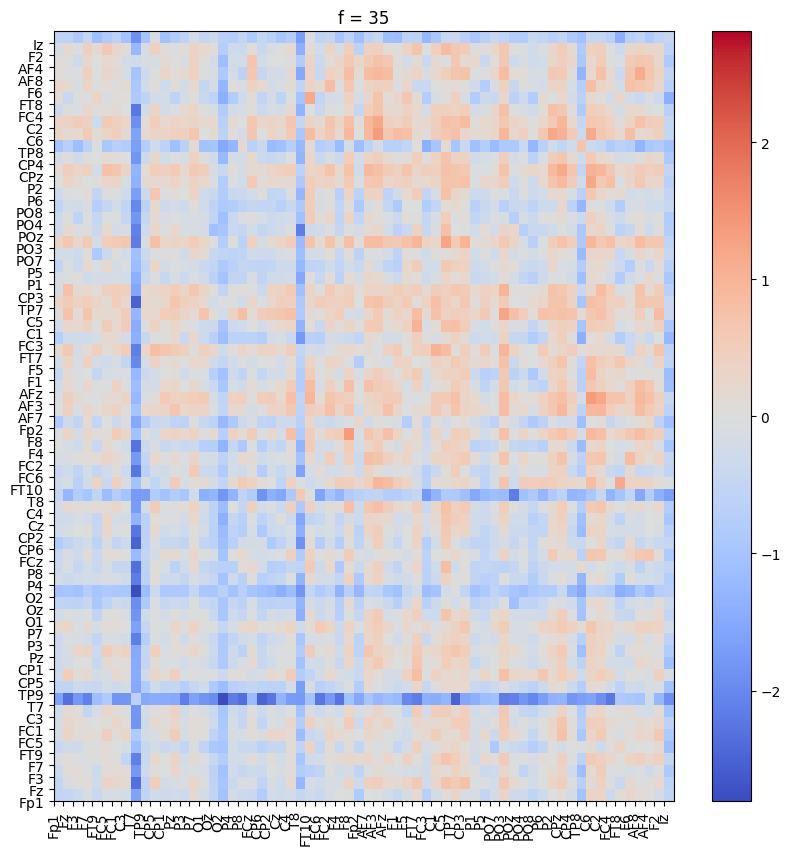

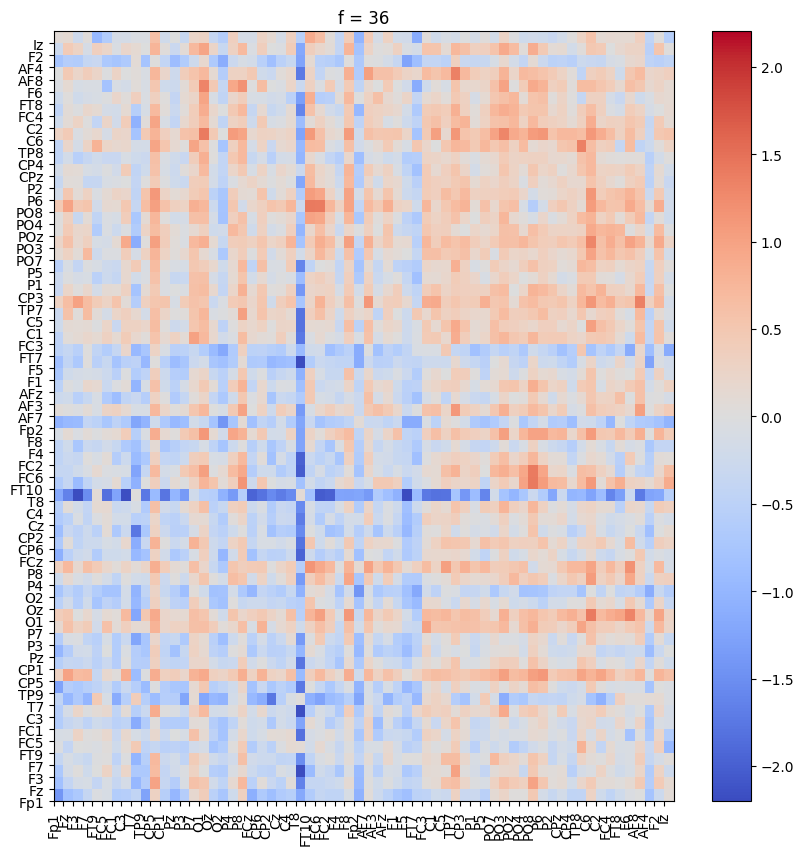

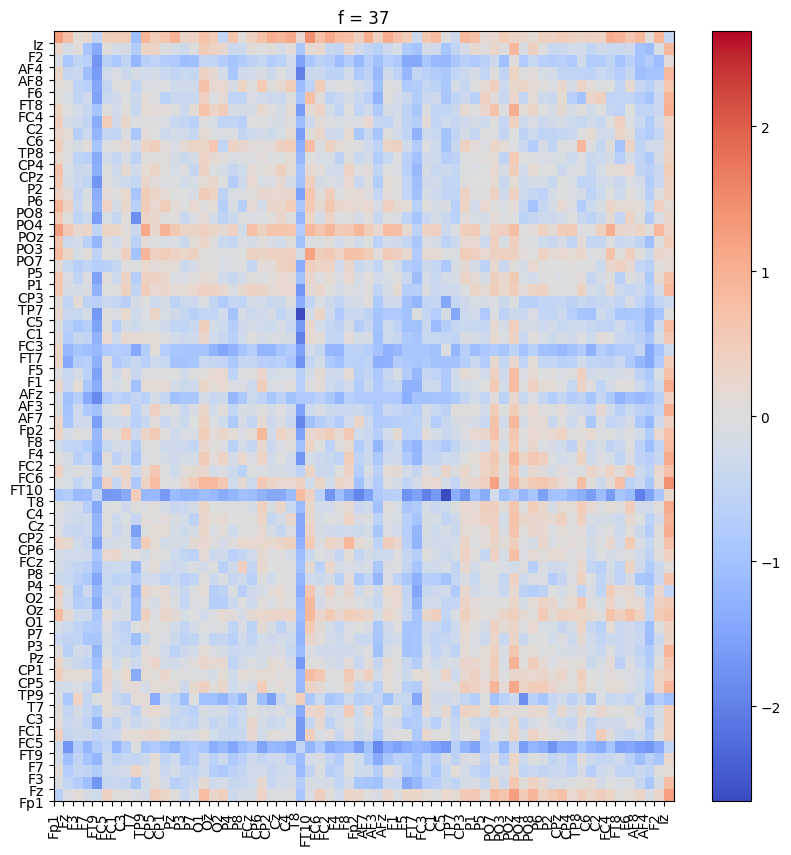

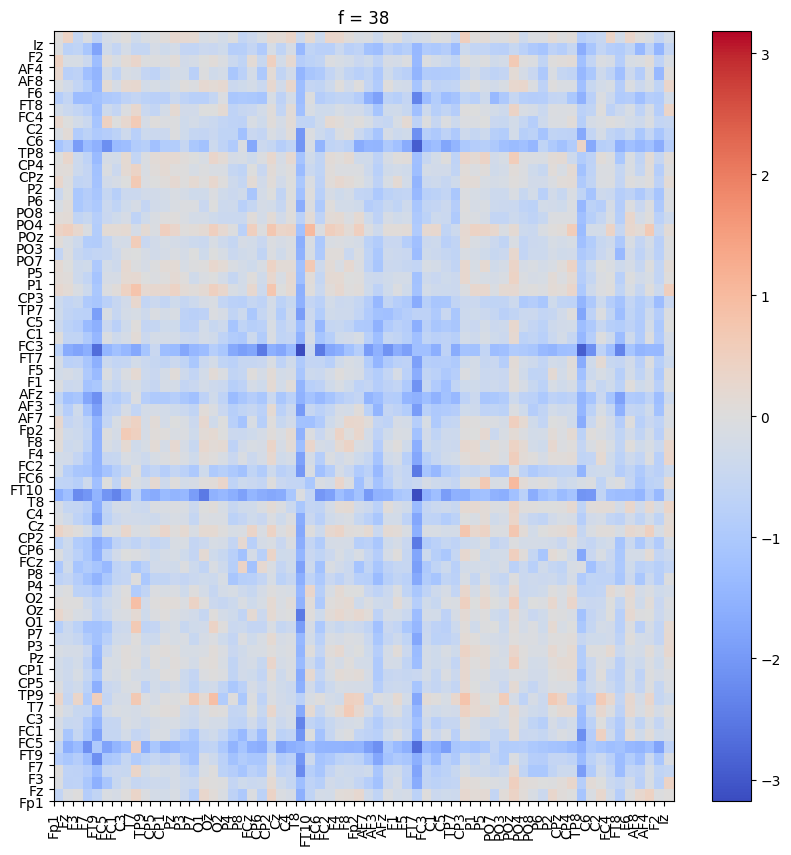

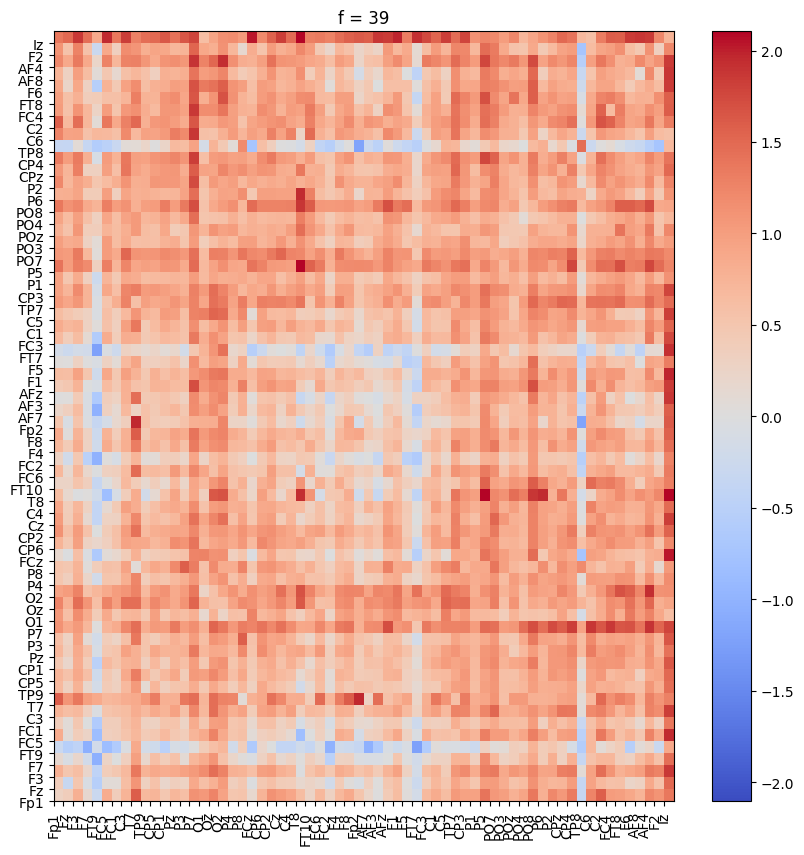

In [21]:
cmap = cm.coolwarm
for f in range(40):
    p_val = p_values_corr[:,:,f]
    t_val = t_stat_corr[:,:,f]
    img = t_val
    plt.figure(figsize=(10, 10))
    plt.yticks(range(64), list_channels)
    plt.xticks(range(64), list_channels, rotation=90)
    plt.title('f = ' + str(f))
    pc = plt.pcolormesh(img, norm=colors.CenteredNorm(), cmap=cmap)
    plt.colorbar(pc)
    plt.show()

# Coherence, Cross Correlation

In [6]:
#zscore normalization
for i in range(MI.shape[0]):
    for j in range(MI.shape[1]):
        MI[i][j] = sc.stats.zscore(MI[i][j])

for i in range(rest.shape[0]):
    for j in range(rest.shape[1]):
        rest[i][j] = sc.stats.zscore(rest[i][j])

In [22]:
MI = MI[:,:,:200]
rest = rest[:,:,:200]

In [25]:
#t-test on PSD for each channel
nperseg = 100
n_channels = 64
n_mi_trials = MI.shape[0]
n_res_trials = rest.shape[0]

t_stat = np.zeros((n_channels,nperseg//2+1))
p_values = np.zeros((n_channels,nperseg//2+1))
for channel_id in range(n_channels): #for each channel
    MI_set = np.zeros((nperseg//2+1, n_mi_trials))
    rest_set = np.zeros((nperseg//2+1, n_res_trials))
    for trial_id in range(MI.shape[0]): #for each trial
        signal_mi = MI[trial_id, channel_id, :500]
        f, Pxx = signal.welch(signal_mi, fs=500, nperseg=100)
        MI_set[:,trial_id] = Pxx

    for trial_id in range(rest.shape[0]):
        signal_rest = rest[trial_id, channel_id, :500]
        f, Pxx = signal.welch(signal_rest, fs=500, nperseg=100)
        rest_set[:,trial_id] = Pxx

    t_stat[channel_id,:], p_values[channel_id,:] = sc.stats.ttest_ind(MI_set, rest_set, axis=1)


print("t-statistics: ", t_stat)
print("p-values: ", p_values)

t-statistics:  [[ 1.45044463 -0.01832558 -0.63349256 ... -0.88416198 -1.19134924
   0.17779226]
 [-0.69087542 -0.51452901  0.83547625 ...  0.02104734 -0.99234867
   0.20623936]
 [-0.36794845 -0.58732545  0.64145827 ... -0.40546896 -1.04516797
   0.33948937]
 ...
 [ 1.12565617 -0.32598985  0.40485338 ... -0.61984035 -1.27109841
   0.31951363]
 [-0.20552171 -0.61071148  0.90535101 ...  0.19218951 -1.03434576
  -0.11309922]
 [ 0.86495242  0.74633827  0.81247199 ... -0.12123265 -0.96195914
  -0.31720716]]
p-values:  [[0.15232134 0.98544202 0.52890231 ... 0.38025931 0.23836896 0.85950562]
 [0.49239969 0.60883735 0.40687817 ... 0.98328014 0.32514953 0.8373262 ]
 [0.71425111 0.55926473 0.52375192 ... 0.68662467 0.30028184 0.73546735]
 ...
 [0.26494749 0.74560532 0.6870746  ... 0.53779053 0.20876791 0.75048509]
 [0.83788419 0.5437765  0.36902506 ... 0.84826508 0.30526814 0.91034245]
 [0.39062838 0.45847765 0.41984322 ... 0.9039258  0.34006359 0.75222549]]


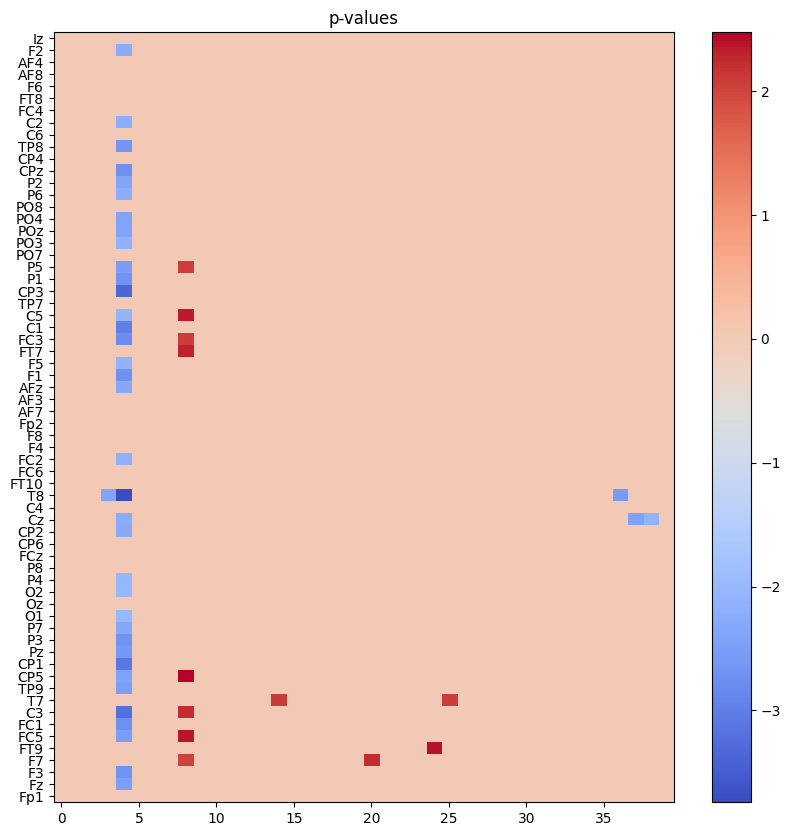

In [26]:
p_val = p_values[:,:40]
t_val = t_stat[:,:40]
plt.figure(figsize=(10, 10))
plt.imshow(t_val*(p_val < 0.05).astype(int), aspect='auto', origin='lower', cmap = 'coolwarm')
plt.yticks(range(64), list_channels)
plt.colorbar()
plt.title('p-values')
plt.show()

In [28]:
#t-test on PSD for each channel
nperseg = 100
n_channels = 64
n_mi_trials = MI.shape[0]
n_res_trials = rest.shape[0]

t_stat_corr = np.zeros((n_channels,n_channels,nperseg//2+1))
p_values_corr = np.zeros((n_channels,n_channels,nperseg//2+1))
for channel_id in range(n_channels): #for each channel
    for channel_id2 in range(channel_id,n_channels):
        MI_set = np.zeros((nperseg//2+1, n_mi_trials))
        rest_set = np.zeros((nperseg//2+1, n_res_trials))

        for trial_id in range(MI.shape[0]): #for each trial
            signal_mi_1 = MI[trial_id, channel_id, :]
            signal_mi_2 = MI[trial_id, channel_id2, :]
            
            f,Cxy = signal.csd(signal_mi_1, signal_mi_2, fs=500, nperseg=100)
            MI_set[:,trial_id] = np.abs(Cxy)

        for trial_id in range(rest.shape[0]):
            signal_rest_1 = rest[trial_id, channel_id, :]
            signal_rest_2 = rest[trial_id, channel_id2, :]
            f,Cxy = signal.csd(signal_rest_1, signal_rest_2, fs=500, nperseg=100)
            rest_set[:,trial_id] = np.abs(Cxy)

        t_stat_corr[channel_id,channel_id2,:], p_values_corr[channel_id,channel_id2,:] = sc.stats.ttest_ind(MI_set, rest_set, axis=1)
        t_stat_corr[channel_id2,channel_id,:] = t_stat_corr[channel_id,channel_id2,:]
        p_values_corr[channel_id2,channel_id,:] = p_values_corr[channel_id,channel_id2,:]

print("t-statistics: ", t_stat_corr)
print("p-values: ", p_values_corr)

t-statistics:  [[[ 1.45044463 -0.01832558 -0.63349256 ... -0.88416198 -1.19134924
    0.17779226]
  [ 0.74995281 -0.58623631  0.16409571 ... -0.22261188 -1.13476992
    0.09482683]
  [ 0.92859775 -0.51214075  0.07755258 ... -0.52633897 -1.20616053
    0.31713896]
  ...
  [ 1.44726187 -0.23498704 -0.20499903 ... -0.75192357 -1.34963642
    0.10813687]
  [ 0.88866618 -0.55684629  0.26396109 ... -0.39865119 -1.15384597
    0.07603094]
  [ 1.42279305 -0.40564678  0.02980874 ... -0.77280454 -1.11845231
   -0.12021064]]

 [[ 0.74995281 -0.58623631  0.16409571 ... -0.22261188 -1.13476992
    0.09482683]
  [-0.69087542 -0.51452901  0.83547625 ...  0.02104734 -0.99234867
    0.20623936]
  [-0.54421025 -0.54847788  0.74620447 ... -0.28378743 -1.04260605
    0.29907254]
  ...
  [ 0.26891299 -0.53115664  0.6905082  ... -0.28351292 -1.2842722
    0.0997655 ]
  [-0.44445825 -0.56458731  0.86813416 ...  0.07878331 -1.05139639
    0.06596676]
  [ 0.56107767  0.19631384  0.81198534 ... -0.09135164 -0.9

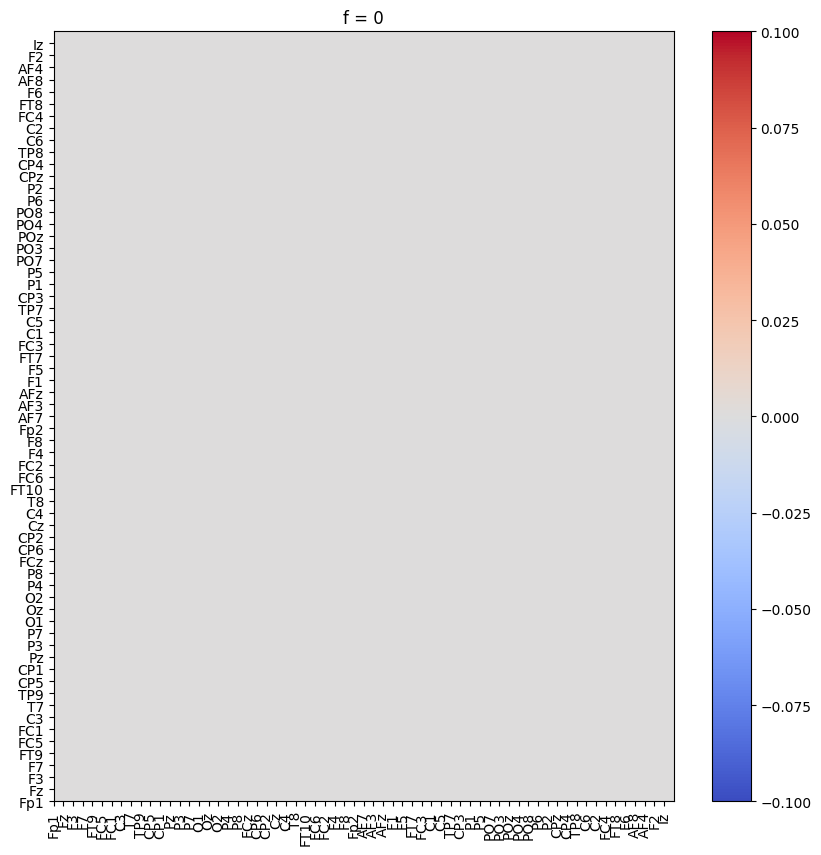

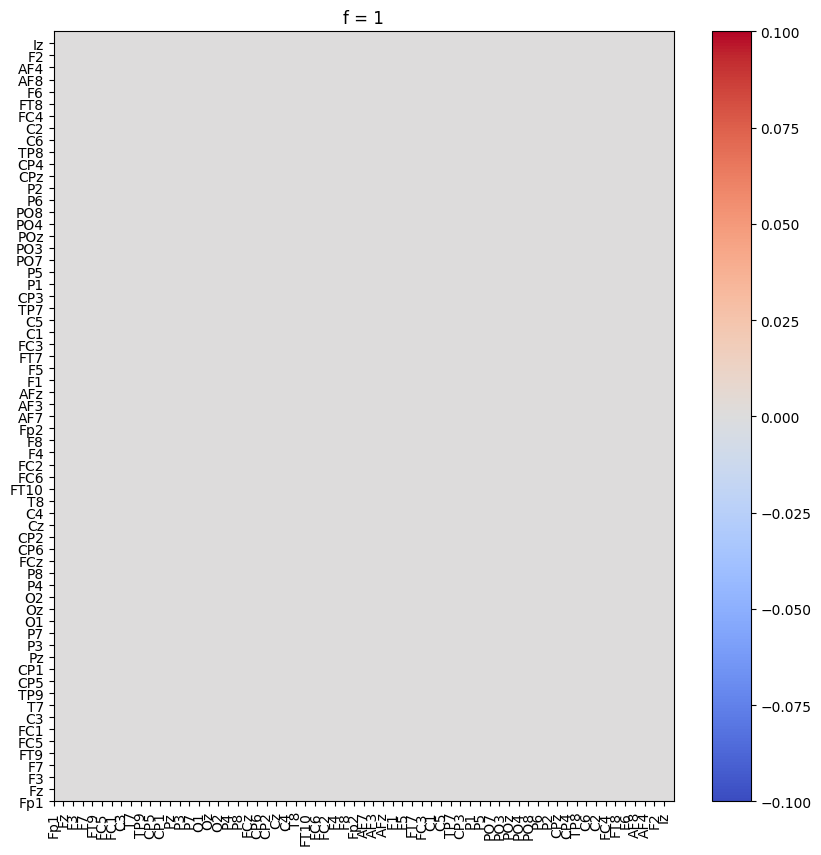

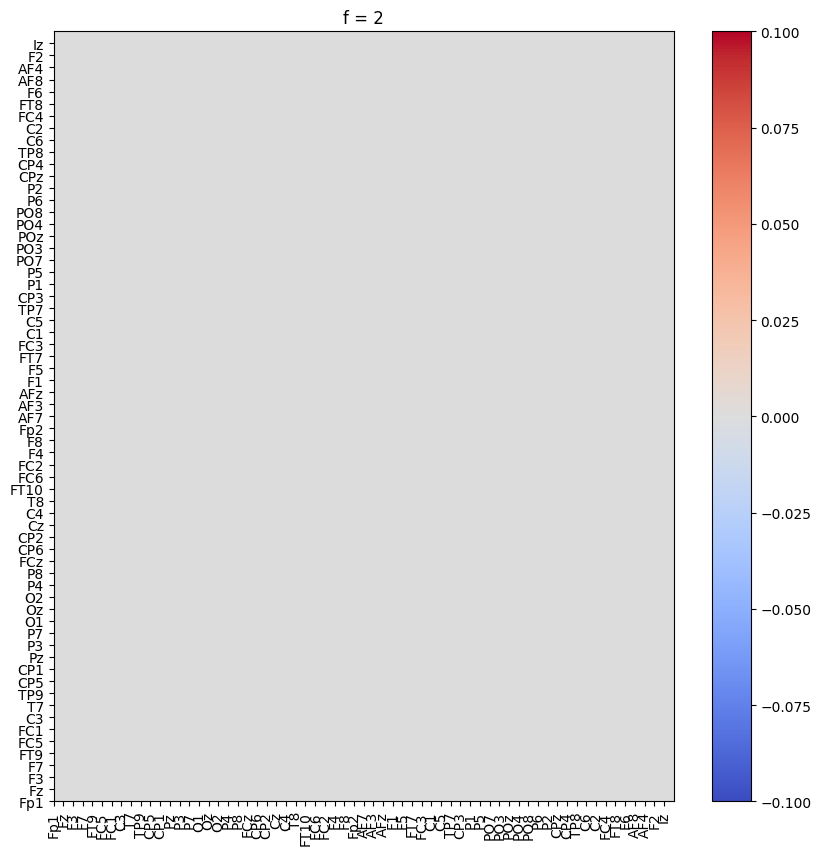

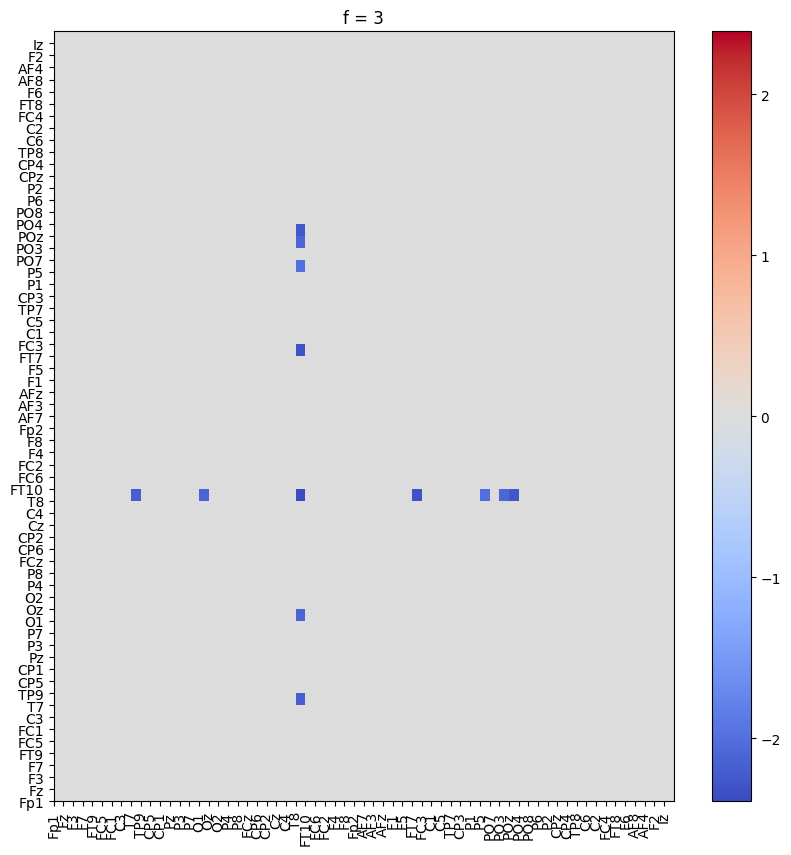

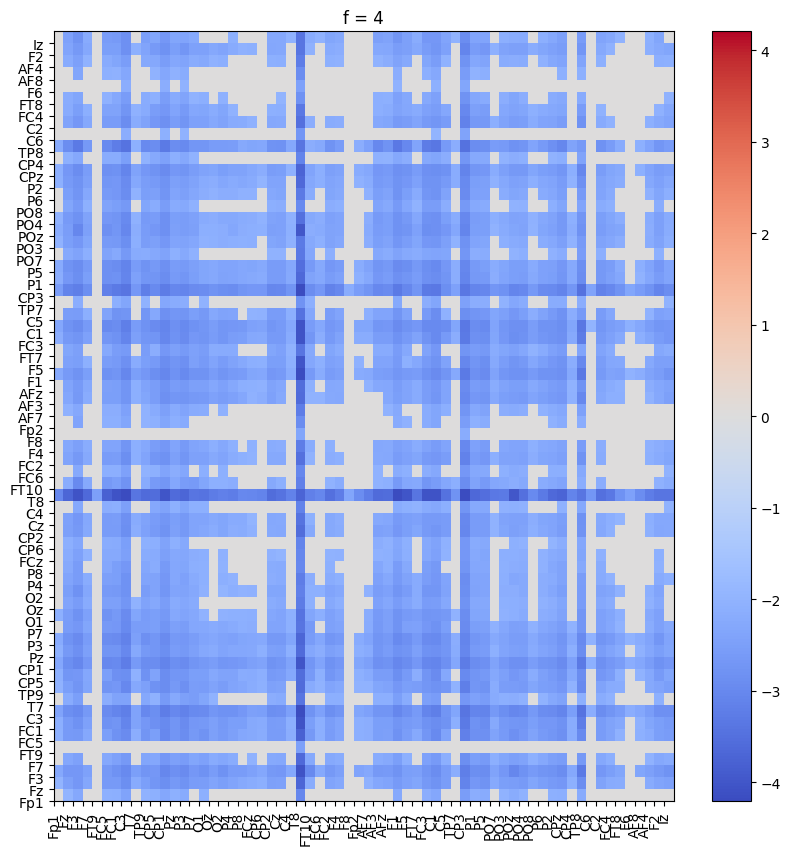

...

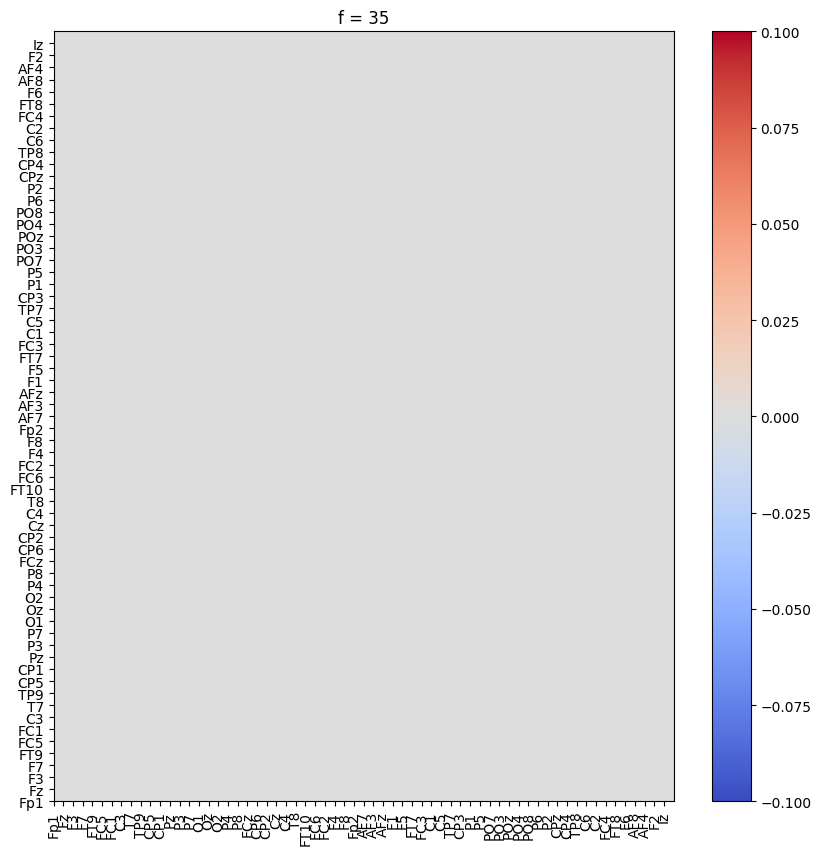

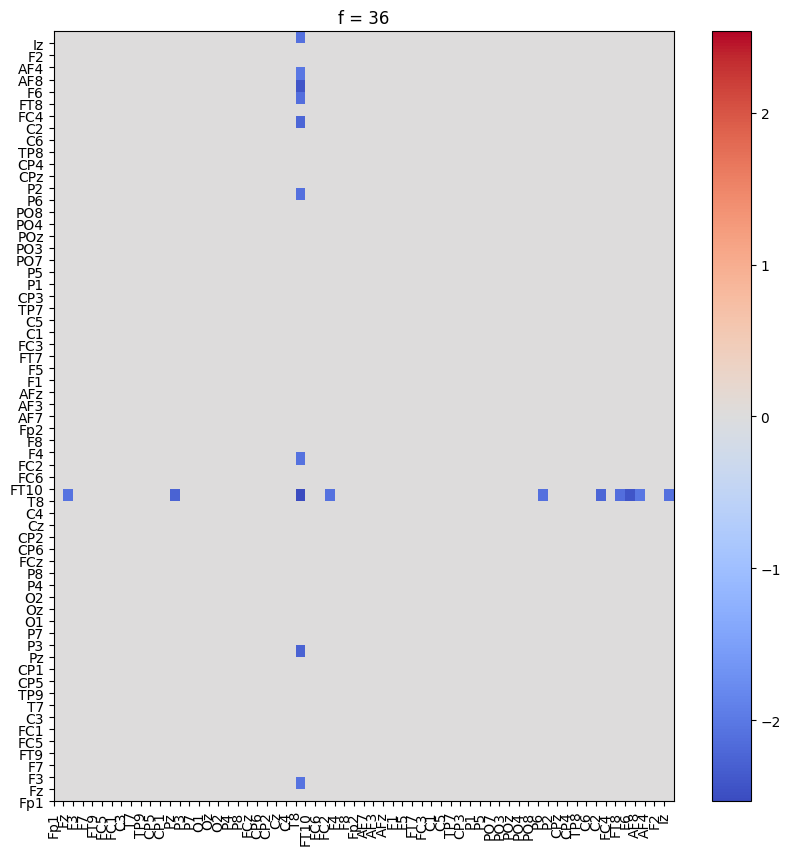

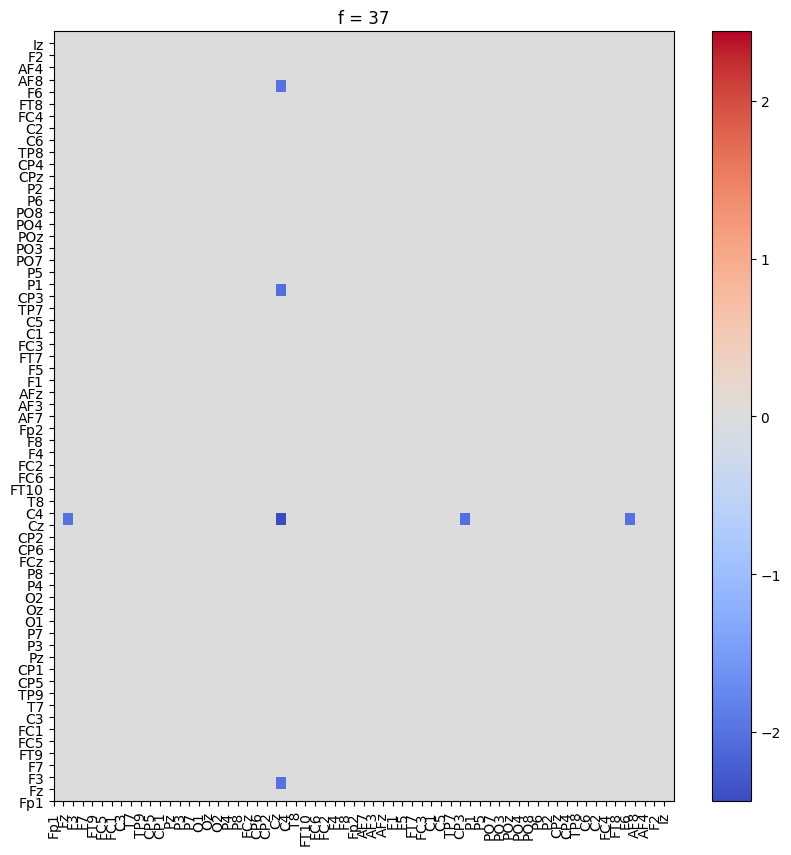

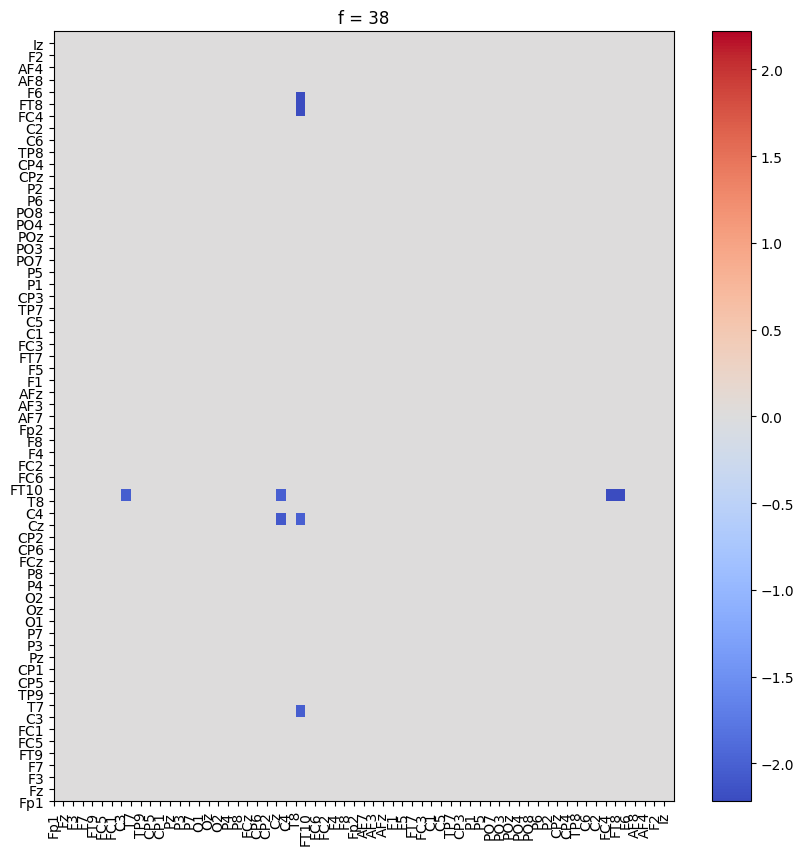

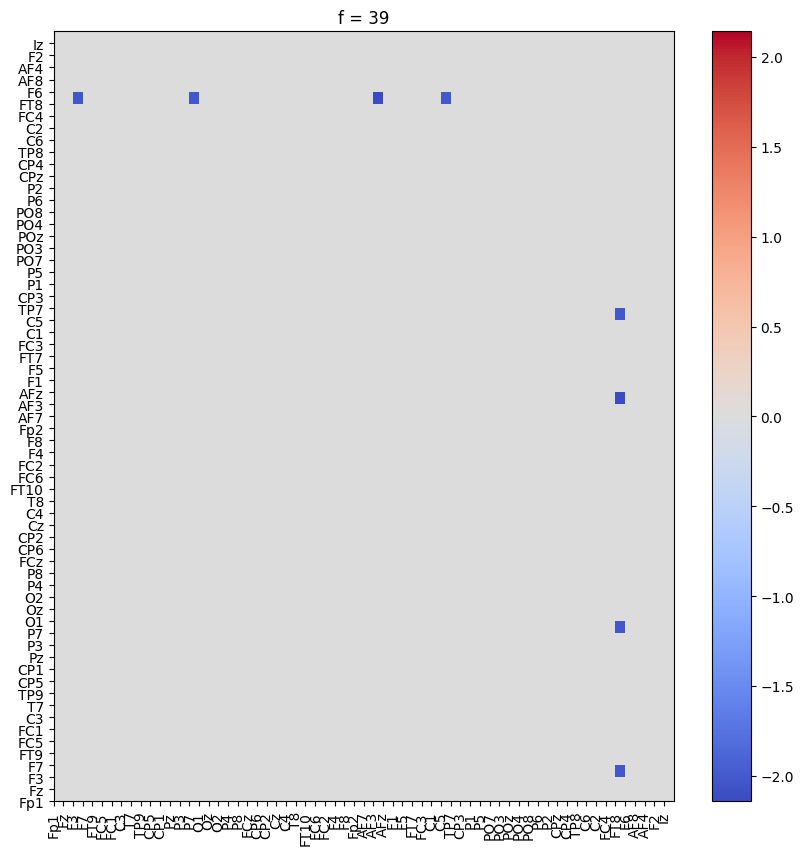

In [29]:
cmap = cm.coolwarm
for f in range(40):
    p_val = p_values_corr[:,:,f]
    t_val = t_stat_corr[:,:,f]
    img = t_val*(p_val < 0.05).astype(int)
    plt.figure(figsize=(10, 10))
    plt.yticks(range(64), list_channels)
    plt.xticks(range(64), list_channels, rotation=90)
    plt.title('f = ' + str(f))
    pc = plt.pcolormesh(img, norm=colors.CenteredNorm(), cmap=cmap)
    plt.colorbar(pc)
    plt.show()

In [32]:
#t-test on PSD for each channel
nperseg = 100
n_channels = 64
n_mi_trials = MI.shape[0]
n_res_trials = rest.shape[0]

t_stat_coh = np.zeros((n_channels,n_channels,nperseg//2+1))
p_values_coh = np.zeros((n_channels,n_channels,nperseg//2+1))
for channel_id in range(n_channels): #for each channel
    for channel_id2 in range(channel_id+1,n_channels):
        MI_set = np.zeros((nperseg//2+1, n_mi_trials))
        rest_set = np.zeros((nperseg//2+1, n_res_trials))

        for trial_id in range(MI.shape[0]): #for each trial
            signal_mi_1 = MI[trial_id, channel_id, :]
            signal_mi_2 = MI[trial_id, channel_id2, :]
            f,Cxy = signal.coherence(signal_mi_1, signal_mi_2, fs=500, nperseg=100)
            MI_set[:,trial_id] = np.abs(Cxy)

        for trial_id in range(rest.shape[0]):
            signal_rest_1 = rest[trial_id, channel_id, :]
            signal_rest_2 = rest[trial_id, channel_id2, :]
            f,Cxy = signal.coherence(signal_rest_1, signal_rest_2, fs=500, nperseg=100)
            rest_set[:,trial_id] = np.abs(Cxy)

        t_stat_coh[channel_id,channel_id2,:], p_values_coh[channel_id,channel_id2,:] = sc.stats.ttest_ind(MI_set, rest_set, axis=1)
        t_stat_coh[channel_id2,channel_id,:] = t_stat_coh[channel_id,channel_id2,:]
        p_values_coh[channel_id2,channel_id,:] = p_values_coh[channel_id,channel_id2,:]

print("t-statistics: ", t_stat_coh)
print("p-values: ", p_values_coh)

/tmp/ipykernel_4194029/2854983069.py:26: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  t_stat_coh[channel_id,channel_id2,:], p_values_coh[channel_id,channel_id2,:] = sc.stats.ttest_ind(MI_set, rest_set, axis=1)


t-statistics:  [[[ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  ...
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ... -3.07097612  0.
    0.        ]
  [ 0.          0.          0.         ...  0.          3.26723838
    0.        ]]

 [[ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.         -3.27730693 ...  0.          0.
    2.17445645]
  ...
  [ 0.          0.          0.         ...  0.          0.
    0.        ]
  [ 0.          0.         -3.18524294 ...  0.          0.
    0.        ]
  [ 0.          0.          0.         ...  0.          0.
    0.        ]]

 [[ 0.          0.          0.         ...  0.          0.
  

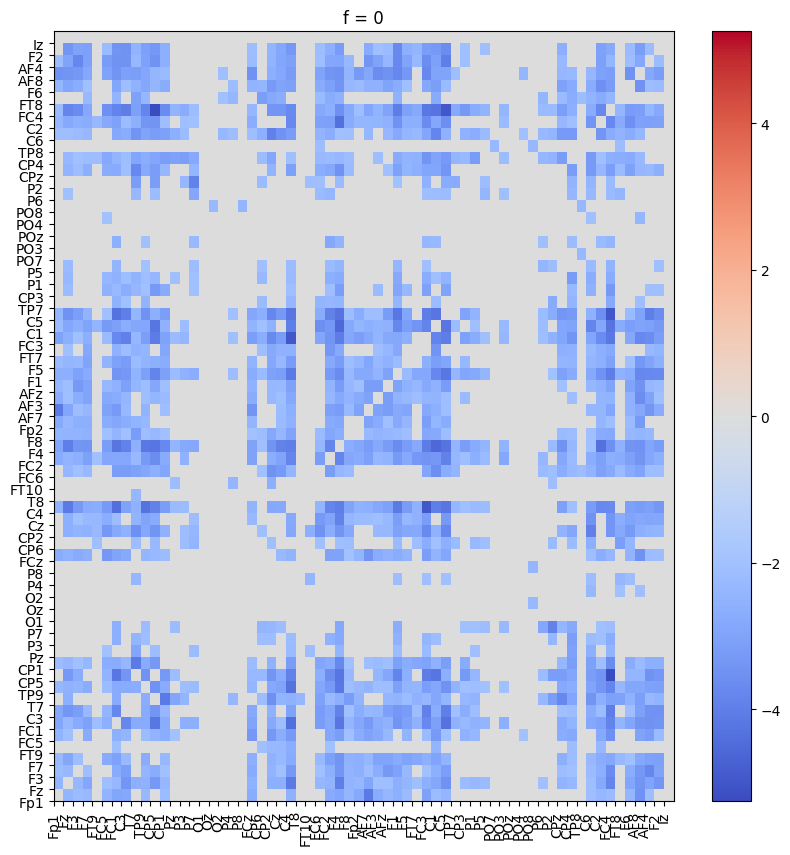

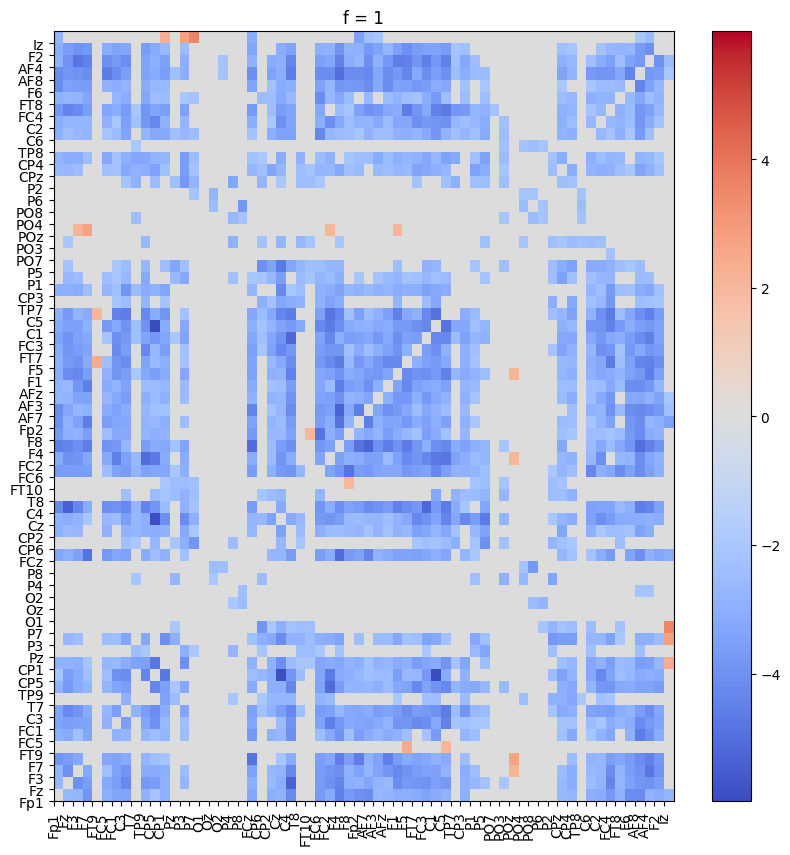

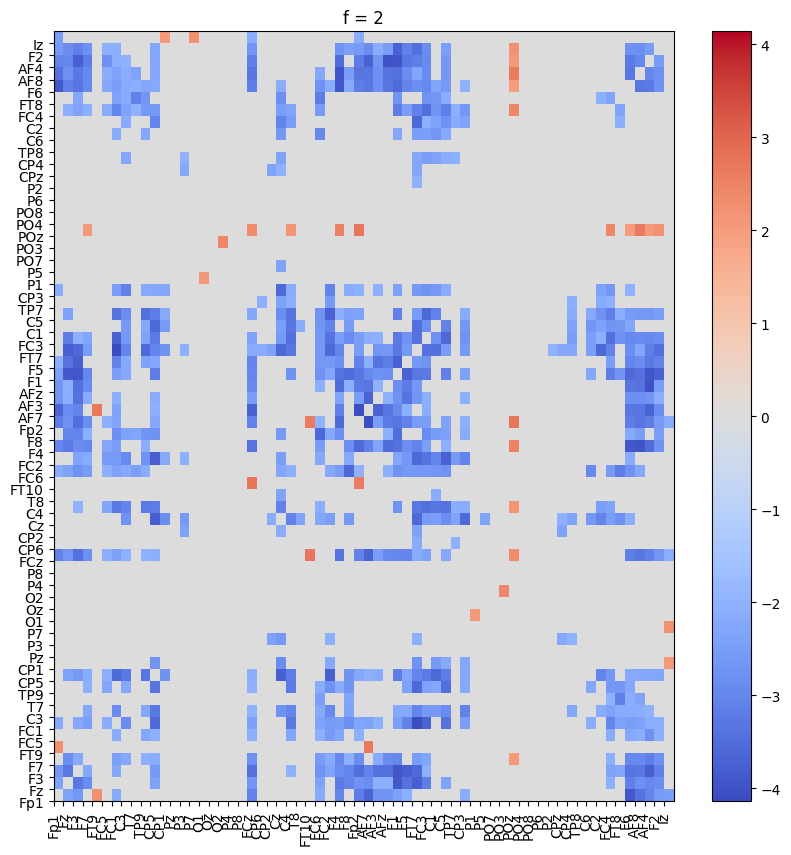

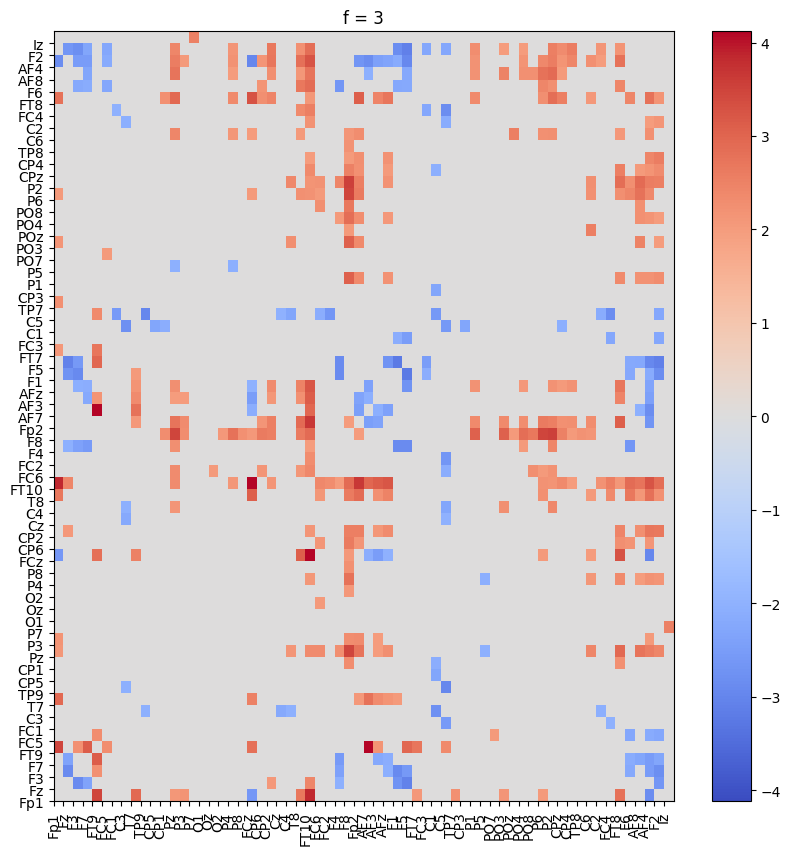

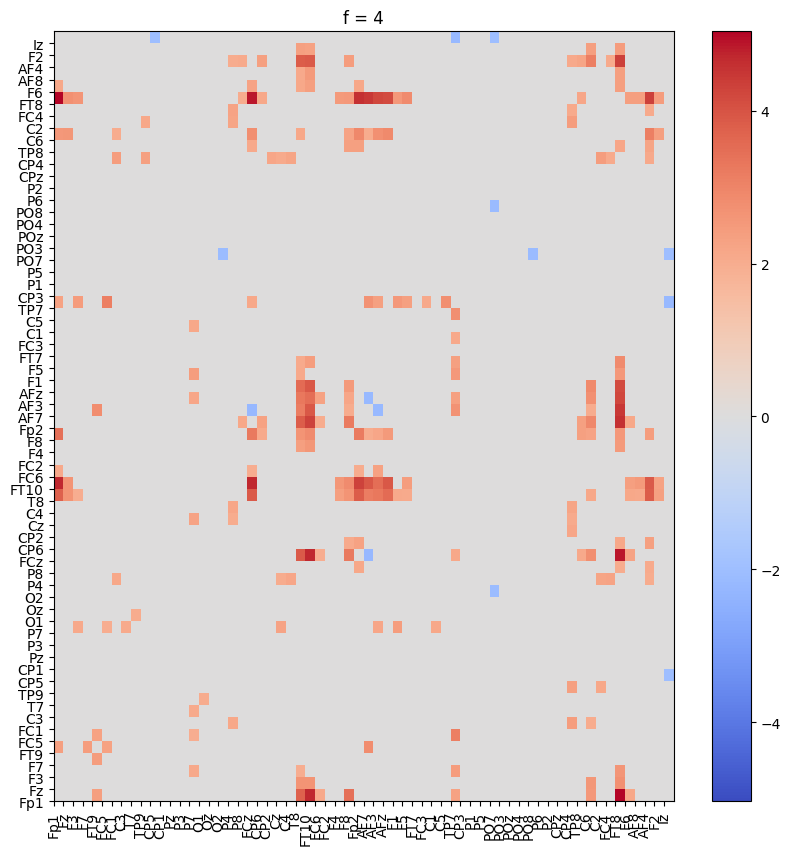

...

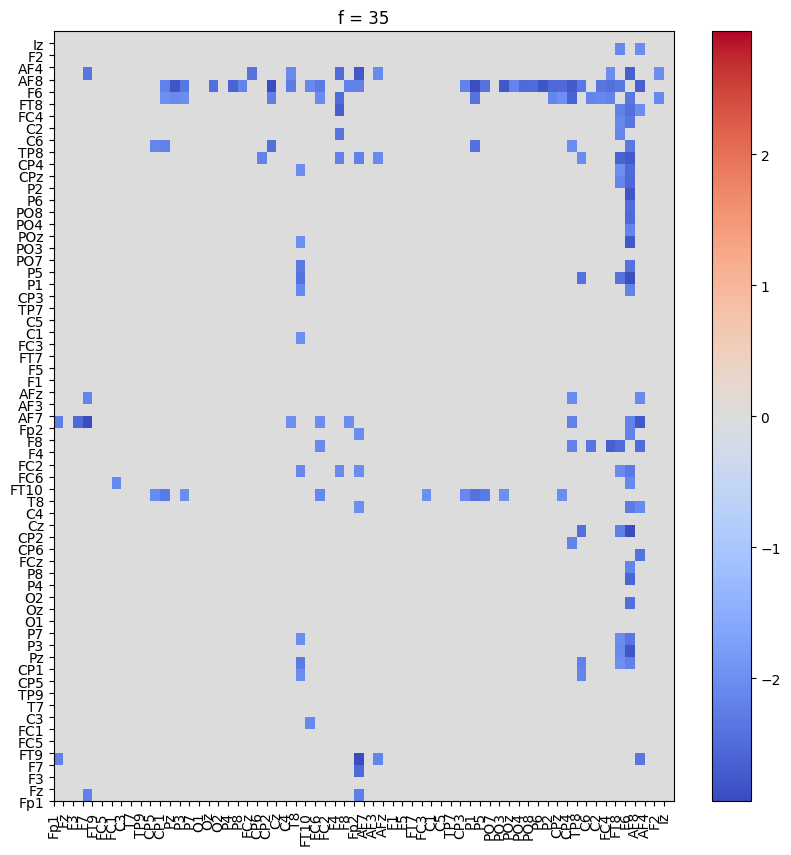

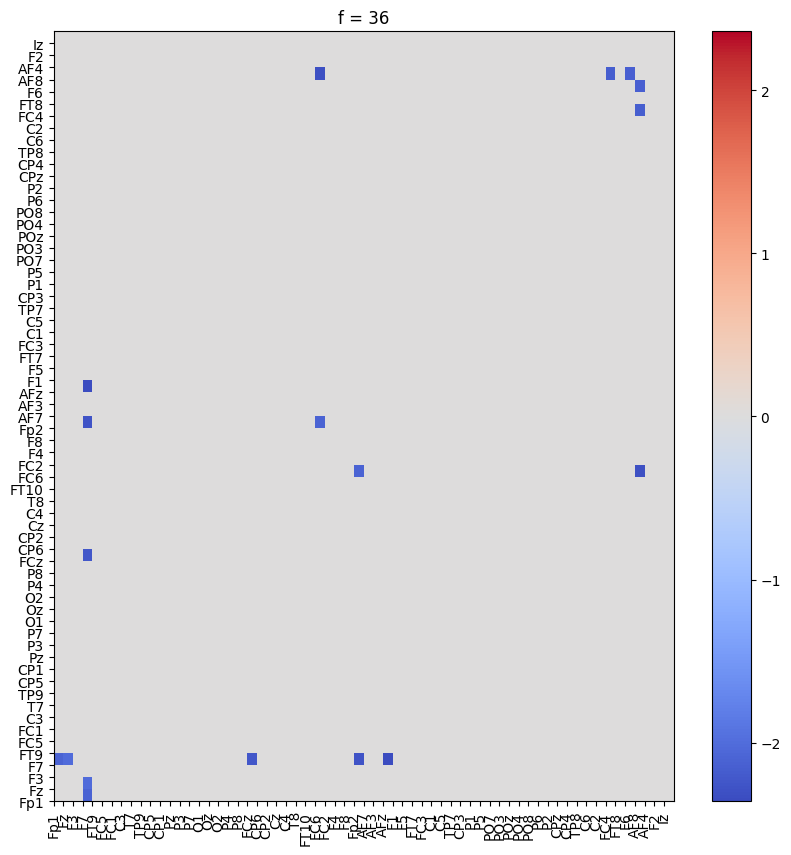

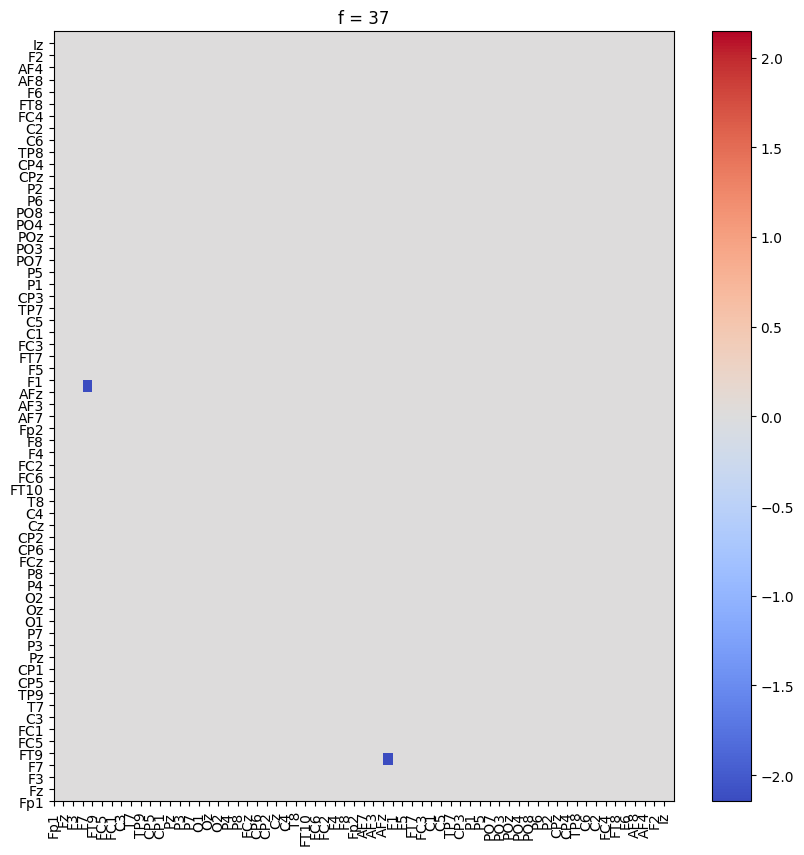

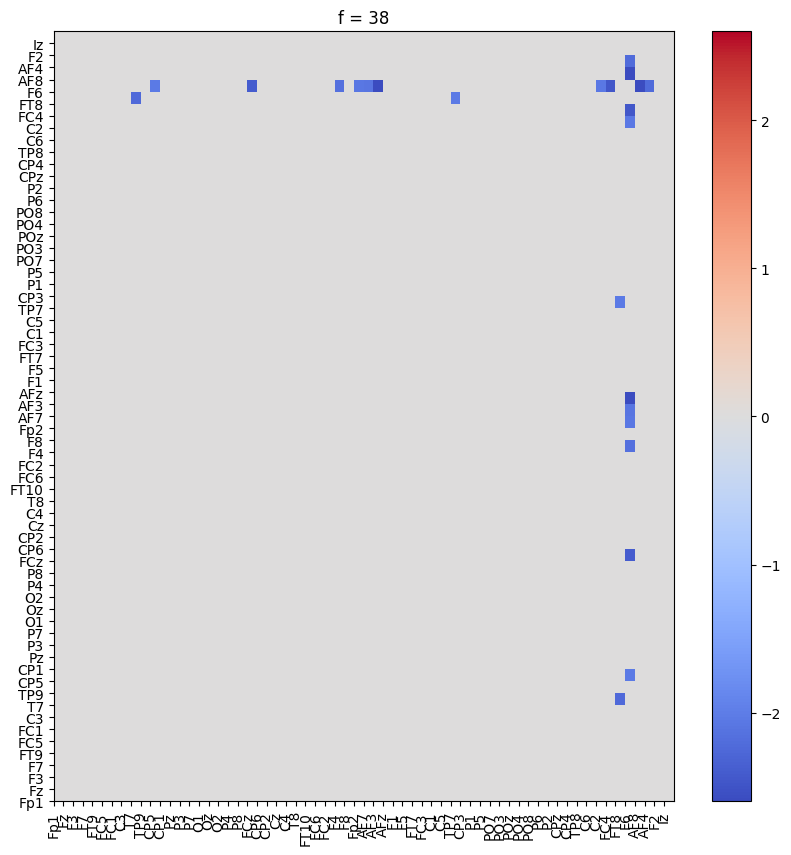

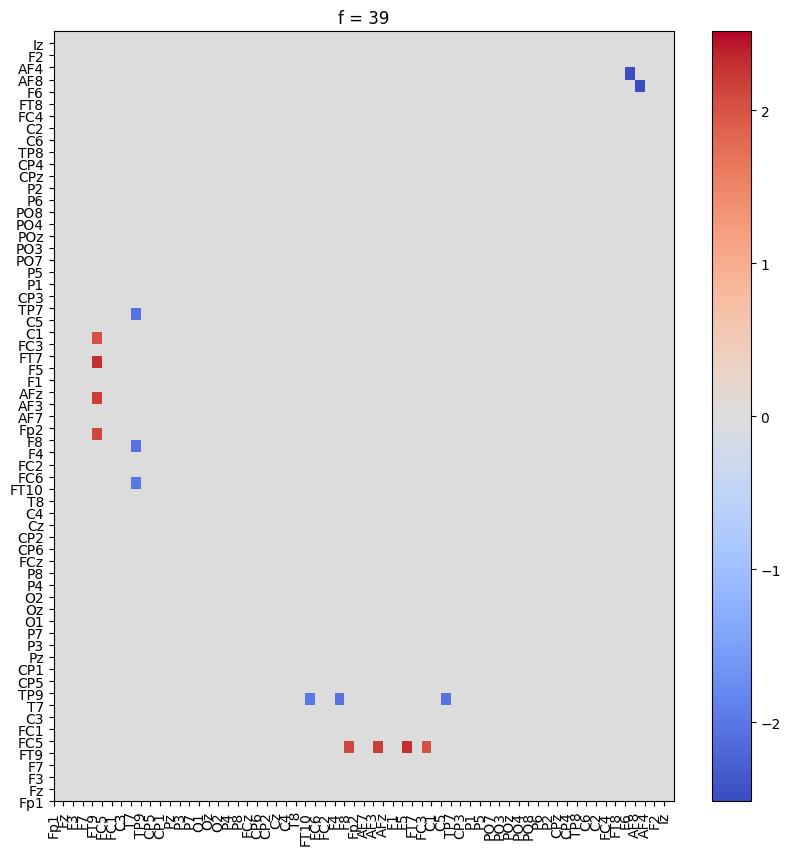

In [14]:
cmap = cm.coolwarm
for f in range(40):
    p_val = p_values_coh[:,:,f]
    t_val = t_stat_coh[:,:,f]
    img = t_val*(p_val < 0.05).astype(int)
    plt.figure(figsize=(10, 10))
    plt.yticks(range(64), list_channels)
    plt.xticks(range(64), list_channels, rotation=90)
    plt.title('f = ' + str(f))
    pc = plt.pcolormesh(img, norm=colors.CenteredNorm(), cmap=cmap)
    plt.colorbar(pc)
    plt.show()